### Model evaluation

Part 1 - Visualize training loss / validation loss

Part 2 - Coco evaluation metrics for test sets

Part 2 - Mask IoU metrics for test sets

## training metrics

In [1]:
import pandas as pd
data = pd.read_json("training/output/metrics.json", lines=True)
data

,data_time,eta_seconds,fast_rcnn/cls_accuracy,fast_rcnn/false_negative,fast_rcnn/fg_cls_accuracy,iteration,loss_box_reg,loss_cls,loss_mask,loss_rpn_cls,...,bbox/AP75,bbox/APl,bbox/APm,bbox/APs,segm/AP,segm/AP50,segm/AP75,segm/APl,segm/APm,segm/APs
0,0.004144,108215.770001,0.414062,0.054094,0.945906,19,0.336895,0.721040,0.691802,3.633809,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.004416,110397.952449,0.619141,0.582541,0.417459,39,0.547719,0.656157,0.689014,1.401511,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.004512,108768.834806,0.748047,0.972894,0.027106,59,0.562834,0.596518,0.681968,0.493670,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.004286,106828.418033,0.800781,1.000000,0.000000,79,0.509412,0.528866,0.670746,0.231399,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,99,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,0.018051,2222.584872,0.910156,0.187500,0.812500,1959,0.416069,0.224654,0.241997,0.026125,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
117,0.017209,1111.072087,0.902344,0.218750,0.781250,1979,0.432195,0.231536,0.241634,0.013134,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
118,NaN,NaN,NaN,NaN,NaN,1999,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
119,0.017181,0.000000,0.906250,0.265625,0.734375,1999,0.402149,0.218490,0.232762,0.020419,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


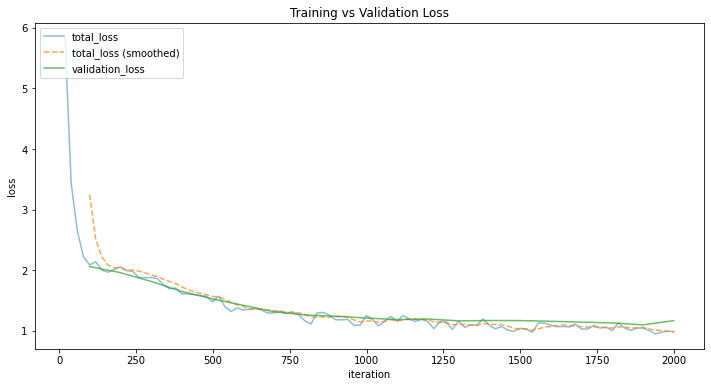

[(99, 2.060654067559741), (199, 1.959872956376505), (299, 1.8150850789836392), (399, 1.6480793616591165), (499, 1.5267659930037694), (599, 1.4199178914378325), (699, 1.3136594880175276), (799, 1.261105374681602), (899, 1.2396139221068903), (999, 1.2109993164172361), (1099, 1.1840116112804167), (1199, 1.193827289456609), (1299, 1.1635703019833623), (1399, 1.1693968161595807), (1499, 1.1683395182548197), (1599, 1.156352130351409), (1699, 1.1429475697301454), (1799, 1.1293372668845292), (1899, 1.0976486836141424), (1999, 1.1669769890398198)]


In [26]:

import json
import matplotlib.pyplot as plt
import numpy as np

experiment_folder = 'training/output'

def load_json_arr(json_path):
    lines = []
    with open(json_path, 'r') as f:
        for line in f:
            lines.append(json.loads(line))
    return lines

def moving_average(values, window_size):
    return np.convolve(values, np.ones(window_size)/window_size, mode='valid')

experiment_metrics = load_json_arr(experiment_folder + '/metrics.json')

total_loss_data = [(x['iteration'], x['total_loss']) for x in experiment_metrics if 'total_loss' in x]
iterations = [x[0] for x in total_loss_data]
total_loss = [x[1] for x in total_loss_data]

window = 5 
smoothed_loss = moving_average(total_loss, window)
smoothed_iterations = iterations[window - 1:]

validation_loss_data = [(x['iteration'], x['validation_loss']) for x in experiment_metrics if 'validation_loss' in x and 'total_loss' not in x]
val_iterations = [x[0] for x in validation_loss_data]
val_loss = [x[1] for x in validation_loss_data]

plt.figure(figsize=(12, 6)) 
plt.plot(iterations, total_loss, label='total_loss', alpha=.5)  
plt.plot(smoothed_iterations, smoothed_loss, label='total_loss (smoothed)', linestyle='--', alpha=.7) 
plt.plot(val_iterations, val_loss, label='validation_loss', alpha=.7)

plt.legend(loc='upper left')
plt.ylabel("loss")
plt.xlabel("iteration")
plt.title("Training vs Validation Loss")
plt.show()

print(validation_loss_data)

## validation loss leveling out around iteration 1399

## evaluate model

In [1]:
#set up
import torch, detectron2
print("detectron2:", detectron2.__version__)

from detectron2.utils.logger import setup_logger
setup_logger()

# import common libraries
import numpy as np
import os, json, cv2, random

# import detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from matplotlib import pyplot as plt
from detectron2.evaluation import COCOEvaluator

%matplotlib inline

detectron2: 0.6


In [2]:
#config
cfg = get_cfg()

#using mask-rcnn config
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.MODEL.DEVICE = 'cpu'
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

#set to model iteration 1399
#joint model
cfg.MODEL.WEIGHTS = "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/model_training/output/model_final.pth"

In [3]:
#register test datasets
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog
from detectron2.data import DatasetCatalog

#merged test set
#register_coco_instances("test_data_all", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test/_annotations.coco.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test")
register_coco_instances("test_maize_specific", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/_annotations.coco.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test")
register_coco_instances("test_setaria_specific", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/setaria_specific/test/_annotations.coco.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/setaria_specific/test")
#register_coco_instances("test_tb1gt1ra3", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images/tb1gt1ra3_testset_final_coco.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images")
#register_coco_instances("test_gt1ra3", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images/gt1ra3_testset_final_coco.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images")
#register_coco_instances("test_setaria", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images/setaria_test_coco.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images")
#register_coco_instances("test_gt1P", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images/gt1P_testset_final_coco.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images")


In [4]:
cfg.MODEL.WEIGHTS

'/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/model_training/output/model_final.pth'

[09/01 23:55:48 d2.data.datasets.coco]: Loaded 25 images in COCO format from /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/_annotations.coco.json
[09/01 23:55:50 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{nor

/usr/local/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


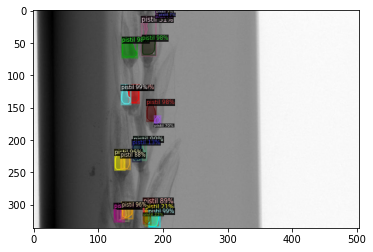

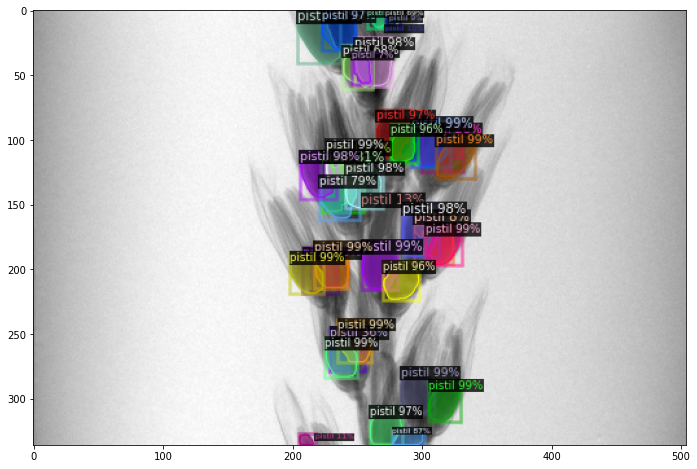

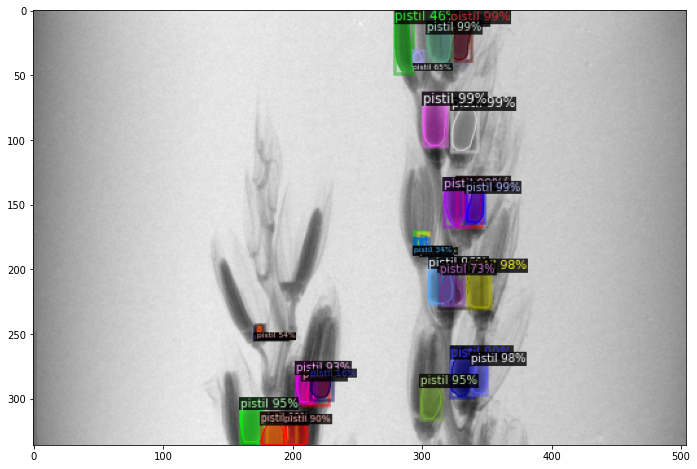

In [5]:
#test running inference with new model, with no confidence threshold cutoff

type_metadata = MetadataCatalog.get("test_maize_specific")
datasetDict = DatasetCatalog.get("test_maize_specific")

predictor = DefaultPredictor(cfg)

from detectron2.utils.visualizer import ColorMode
for d in random.sample(datasetDict, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=type_metadata, scale=0.5, instance_mode=ColorMode.SEGMENTATION)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.imshow(out.get_image())
    plt.rcParams['figure.figsize'] = [12, 8]
    plt.show()

## coco evaluation on hold-out test set

### test_maize_specific

In [6]:
#run coco evaluation on test set with saved model at iteration 1399
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

#Testing

predictor = DefaultPredictor(cfg)

#Call the COCO Evaluator function and pass the test Dataset
evaluator = COCOEvaluator("test_maize_specific", cfg, use_fast_impl=False, output_dir="cocoEvaluation")
test_loader = build_detection_test_loader(cfg, "test_maize_specific")

inference_on_dataset(predictor.model, test_loader, evaluator)

[09/01 23:57:06 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

WARNING [09/01 23:57:06 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[09/01 23:57:06 d2.data.datasets.coco]: Loaded 25 images in COCO format from /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/_annotations.coco.json
[09/01 23:57:06 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   pistil   | 396          |
|            |              |
[09/01 23:57:06 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[09/01 23:57:06 d2.data.common]: Serializing 25 elements to byte tensors and concatenating them all ...
[09/01 23:57:06 d2.data.common]: Serialized dataset takes 0.06 MiB
[09/01 23:57:06 d2.evaluation.evaluator]: Start inference on 25 batc

[09/01 23:59:42 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.


OrderedDict([('bbox',
              {'AP': 55.00934154828989,
               'AP50': 87.20154274784203,
               'AP75': 64.11480017146002,
               'APs': 16.372362030502018,
               'APm': 58.90878249016323,
               'APl': nan}),
             ('segm',
              {'AP': 58.60818533209265,
               'AP50': 87.35140701462491,
               'AP75': 69.29254219420733,
               'APs': 17.286867358054632,
               'APm': 63.26836522984636,
               'APl': nan})])

In [7]:
#run coco evaluation on test set with saved model at iteration 1399
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

#Testing

predictor = DefaultPredictor(cfg)

#Call the COCO Evaluator function and pass the test Dataset
evaluator = COCOEvaluator("test_setaria_specific", cfg, use_fast_impl=False, output_dir="cocoEvaluation2")
test_loader = build_detection_test_loader(cfg, "test_setaria_specific")

inference_on_dataset(predictor.model, test_loader, evaluator)

[09/01 23:59:44 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

WARNING [09/01 23:59:44 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[09/01 23:59:44 d2.data.datasets.coco]: Loaded 24 images in COCO format from /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/setaria_specific/test/_annotations.coco.json
[09/01 23:59:44 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   pistil   | 451          |
|            |              |
[09/01 23:59:44 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[09/01 23:59:44 d2.data.common]: Serializing 24 elements to byte tensors and concatenating them all ...
[09/01 23:59:44 d2.data.common]: Serialized dataset takes 0.10 MiB
[09/01 23:59:44 d2.evaluation.evaluator]: Start inference on 24 ba

OrderedDict([('bbox',
              {'AP': 48.46679996752538,
               'AP50': 81.40932718886106,
               'AP75': 54.680737721687045,
               'APs': 24.920038346842233,
               'APm': 60.61397927690002,
               'APl': nan}),
             ('segm',
              {'AP': 50.012633590538414,
               'AP50': 81.46914119580462,
               'AP75': 58.60554621193164,
               'APs': 25.06981652698448,
               'APm': 62.837546308779594,
               'APl': nan})])

## code for calculating IoU / PR curve

In [6]:
#functions for calculating mask IoU

#set up
import numpy as np
from pycocotools import mask
import cv2
from detectron2.utils.visualizer import ColorMode 

#converts polygon to binary mask, input is a single polygon mask from Detectron2
def toBinaryMask(seg):
    height, width = 672, 1008
    maskk = np.zeros([height, width], dtype=np.uint8)
    polygon = np.array(seg).reshape(-1, 2).astype(int)
    cv2.fillPoly(maskk, [polygon], 1)
    gt_mask = np.array(maskk).astype(np.uint8)
    return gt_mask

#calculates individual mask IoU for each image in the test set, as well as the mean IoU per image. Input is the test set datasetDict from Detectron2.
#uses coco api for IoU calc
#also generates overlap images
def calcTestsetMaskIoU(test_dataset):
    datasetDict=test_dataset
    #iterate through each image in test set
    meanIous = []
    allIous = []
    allConf = []
    totalGt = 0
    totalPred = 0
    for d in datasetDict:
        totalGt = totalGt + len(d["annotations"])
        topIous = []
        print("Calculating IoU for image", d['image_id'], "of", len(datasetDict), d['file_name'])
        #run inference on image
        im = cv2.imread(d["file_name"])
        outputs = predictor(im)
        totalPred = totalPred + len(outputs['instances'].pred_masks)
        #setup plotting
        v = Visualizer(im[:, :, ::-1], metadata=type_metadata, scale=0.5, instance_mode=ColorMode.SEGMENTATION)
        #plot ground truth masks (blue)
        for gts in d["annotations"]:
            v.draw_binary_mask(np.array(toBinaryMask(gts["segmentation"][0])), alpha=.5,color="cornflowerblue") #lol
        #iterate through each prediction in image 
        for pred in outputs['instances'].pred_masks:
            #convert mask to binary, rle encoding
            pred_mask = np.array(pred).astype(np.uint8)
            #plot prediction masks (orange)
            v.draw_binary_mask(pred_mask, alpha=.05,color="orangered")
            rle_pred = mask.encode(np.asfortranarray(pred_mask))
            #iterate through each ground truth mask for image
            currTop=0
            for annos in d["annotations"]:
                current_seg = annos["segmentation"][0]
                binary_gt_mask = toBinaryMask(current_seg)
                rle_gt = mask.encode(np.asfortranarray(binary_gt_mask))
                currIou = mask.iou([rle_gt], [rle_pred], [0])[0, 0]
                #print(currIou)
                #print(currTop)
                if currIou > currTop:
                    currTop=currIou
            topIous.append(currTop)
        print("Individual mask IoUs", topIous)
        print("Mean IoU for image", np.mean(topIous))
        meanIous.append(np.mean(topIous))
        allConf = allConf + (outputs["instances"].scores.tolist())
        allIous = allIous + topIous
        #display image
        #v = Visualizer(im[:, :, ::-1], metadata=type_metadata, scale=0.5, instance_mode=ColorMode.SEGMENTATION)
        #out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        #plt.imshow(out.get_image())
        v = v.get_output()
        plt.imshow(v.get_image()[:, :, ::1])
        plt.rcParams['figure.figsize'] = [36, 24]
        #plt.savefig("detection_examples/"+os.path.basename(d["file_name"]))
        plt.show()
        plt.clf()
        
    print("Mean IoUs for each image in test set", meanIous)
    print("Mean across whole test set", np.mean(meanIous))
    print("Total ground truth annotations for whole set", totalGt)
    print("Total predictions for whole set", totalPred)
    return allConf, allIous, totalGt


In [7]:
#functions for plotting PR curves and F1 score
import pandas as pd
from matplotlib.collections import LineCollection
from matplotlib.colors import BoundaryNorm, ListedColormap
from matplotlib.pyplot import savefig

def calcPRIous(conf, ious, totalGt, savename):
    dfFinal = pd.DataFrame()
    dfPR = pd.DataFrame(
        {'conf': conf,                                                                                                                                                              
         'ious': ious,
        })
    dfPR = dfPR.sort_values('conf', ascending = False)
    dfPR = dfPR.reset_index(drop=True)
    
    fig, (ax, ax3, ax2) = plt.subplots(1, 3, figsize=(18, 6))
    
    iou_thresholds=[.5,.55,.6,.65,.7,.75,.8,.85,.9,.95]
    for thresh in iou_thresholds:
        print("On threshold", thresh, ":")
        newDf = dfPR
        newDf["iou"+str(thresh)] = newDf.ious > thresh
        prec, rec = calcPR(newDf, totalGt, "iou"+str(thresh))
        newDf["precision"] = prec
        newDf["recall"] = rec
        newDf["f1"] = (2*(newDf["precision"]*newDf["recall"]))/(newDf["precision"]+newDf["recall"])
        print("Max F1 score:", newDf.iloc[[newDf['f1'].idxmax()]]["f1"].values)
        print("Confidence at max F1 score:", newDf.iloc[[newDf['f1'].idxmax()]]["conf"].values)
        sorted_recall = newDf['recall'].values
        sorted_precision = newDf['precision'].values
        sorted_conf = newDf['conf'].values
        points = np.array([sorted_recall, sorted_precision]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        norm = plt.Normalize(sorted_conf.min(), sorted_conf.max())
        lc = LineCollection(segments, cmap='viridis', norm=norm)
        lc.set_array(sorted_conf)
        lc.set_linewidth(2)
        line = ax.add_collection(lc)
        ax3.plot(newDf['recall'], sorted_precision, label=f'IoU {thresh}')
        ax2.plot(sorted_conf, newDf['f1'], label=f'IoU {thresh}')
        dfFinal =  pd.concat([dfFinal,newDf])
    fig.colorbar(line, ax=ax)
    ax.set_title('Precision vs Recall')
    ax.set_xlabel('Recall')
    ax.set_ylabel('Precision')
    ax3.set_title('Precision vs Recall')
    ax2.set_xlabel('Recall')
    ax2.set_ylabel('Precision')
    ax2.legend()
    ax3.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax2.set_title('Confidence vs F1 Score')
    ax2.set_xlabel('Confidence')
    ax2.set_ylabel('F1 Score')
    ax2.legend()
    ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.savefig(savename+".jpg")
    plt.savefig(savename+".pdf")
    plt.show()
    dfFinal.to_csv(savename+".csv")
        
def calcPR(dataframe, totalGt, iou_thresh):
    precision=[]
    recall=[]
    count_true=0
    total_true=totalGt
    for index, row in dataframe.iterrows():
        total_pred = index+1
        count_true=count_true+(row[iou_thresh]==True)
        precision.append(count_true/total_pred)
        recall.append(count_true/total_true)
    return precision, recall

## figure out best threshold, make PR and F1 curves

[07/01 17:30:04 d2.data.datasets.coco]: Loaded 25 images in COCO format from /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/_annotations.coco.json
Calculating IoU for image 0 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/ra3gt1_4_-0500000002_jpg.rf.4782b9579be52e47059b9fca9a5f4836.jpg
Individual mask IoUs [0.8708260105448155, 0.9048128342245989, 0.7238938053097345, 0.7009109311740891, 0.8427773343974462, 0.8871308016877637, 0.7088055797733217, 0, 0.7637130801687764, 0.8275862068965517, 0.5649717514124294, 0, 0, 0, 0, 0.8154648956356736, 0, 0.4995417048579285, 0.5656192236598891, 0.8974630021141649]
Mean IoU for image 0.5286758580928592


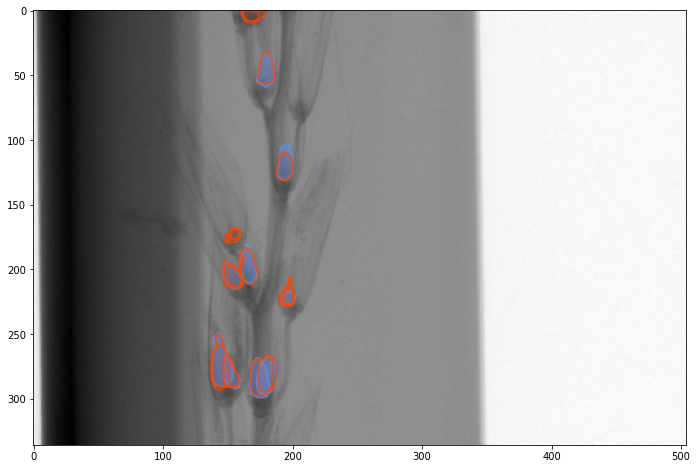

Calculating IoU for image 1 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/gt1_p_test2-0400000009_jpg.rf.a288ad45f53fdba49de4ed779b39bf48.jpg
Individual mask IoUs [0.7842876165113183, 0.6896551724137931, 0.6036585365853658, 0.6923076923076923, 0.9448094612352168, 0.8569321533923304, 0.6179245283018868, 0.7536231884057971, 0, 0.4088235294117647, 0.7657295850066934, 0, 0, 0.6062717770034843, 0, 0.3081896551724138, 0, 0.4962962962962963, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.016163793103448277, 0, 0, 0.36511627906976746]
Mean IoU for image 0.26205262541815494


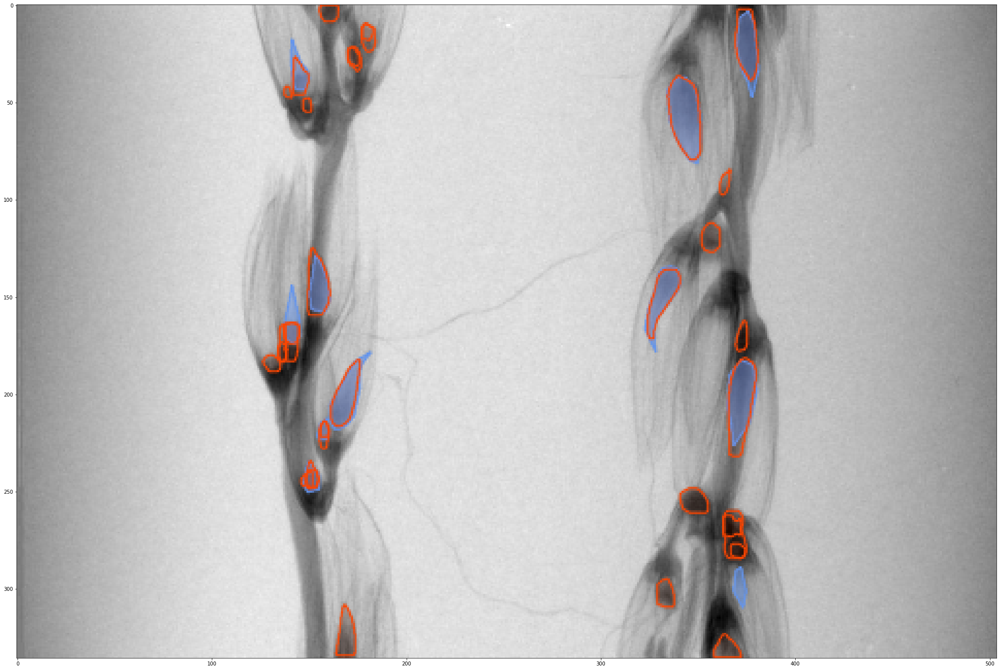

Calculating IoU for image 2 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/158-2-0500000009_jpg.rf.0c0685738532432ef12b976db2e6a970.jpg
Individual mask IoUs [0.8770843258694616, 0.9470954356846473, 0.8875219683655536, 0.8824921135646687, 0.9277857484457197, 0.9361252115059222, 0.9095975232198142, 0.850784230606189, 0.6709633649932157, 0.8243243243243243, 0.8490945674044266, 0.8141643059490085, 0.5814497272018706, 0.8706577974870657, 0, 0, 0.5933568193256165, 0, 0.6717171717171717, 0, 0, 0, 0.03467618561958185, 0, 0.5345394736842105, 0, 0, 0.16648590021691975, 0.38705170004657663, 0.6923597025016903, 0, 0.5073147711184521]
Mean IoU for image 0.4817700740266284


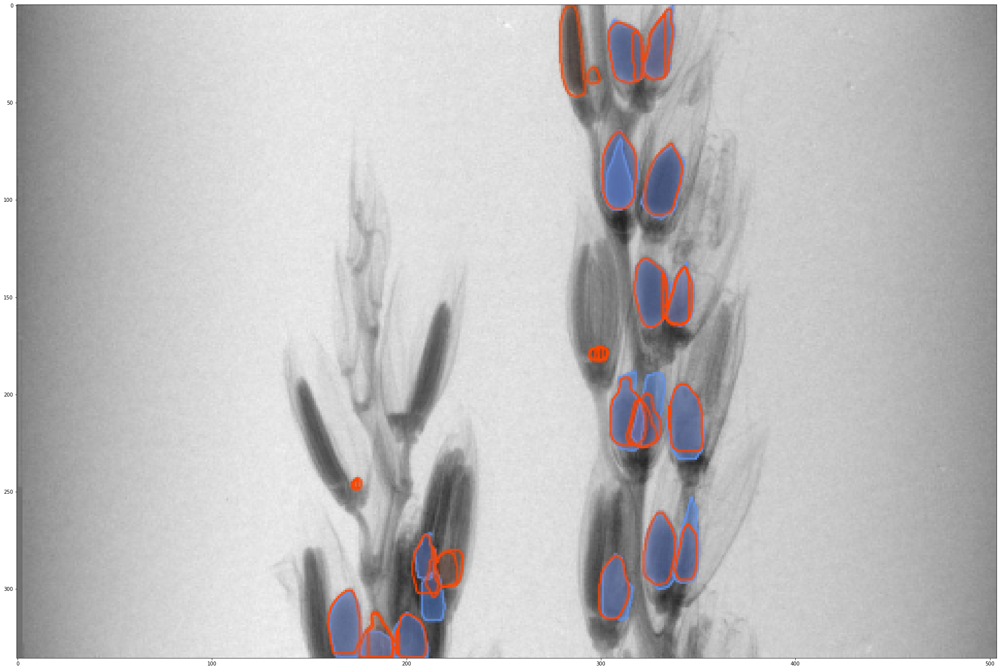

Calculating IoU for image 3 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/158-10-0200000009_jpg.rf.177c5bb0e1d2ede884a2c5a85f925f43.jpg
Individual mask IoUs [0.8755129958960328, 0.8803874092009685, 0.8690476190476191, 0.8960931005818786, 0.8687329079307201, 0.8952380952380953, 0.862051282051282, 0.8374363327674024, 0.9126344086021505, 0.9264091858037579, 0.8856897292651482, 0.9025641025641026, 0.8514285714285714, 0.8654314968308142, 0.819089207735496, 0.8871614844533601, 0.7867278797996661, 0.9298845660538692, 0.8308856252781487, 0.7779531109107304, 0.9062237174095878, 0.9060402684563759, 0.7841269841269841, 0.7767137096774194, 0.7880220646178093, 0.7586402266288952, 0.877262964099417, 0.562049062049062, 0.8376891334250344, 0.7028061224489796, 0.8023553507424476, 0.8374384236453202, 0.8658070678127985, 0.9098621420996819, 0.8076923076923077, 0.7328646748681898, 0.6192281185389387, 0.7239382239382239, 0.51294865970013

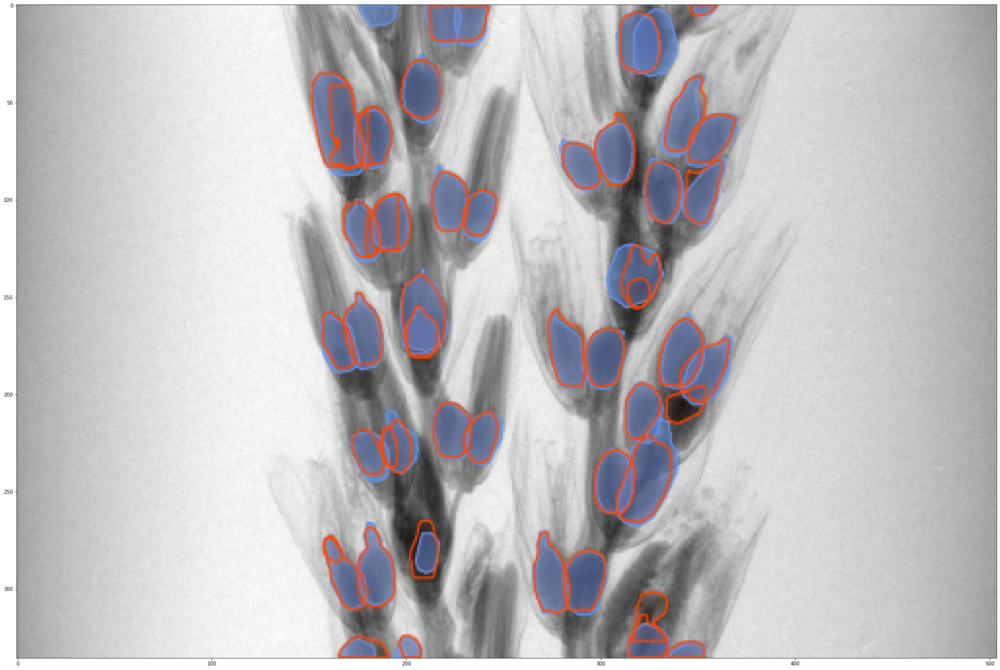

Calculating IoU for image 4 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/ra3gt1_4_-0400000002_jpg.rf.088f2de33fb37afc92756bd980d0b58b.jpg
Individual mask IoUs [0.7796901893287436, 0.752851711026616, 0.7097938144329897, 0.8300359712230215, 0.7538538040775733, 0.7919463087248322, 0.7619047619047619, 0.8498862774829417, 0.7801418439716312, 0.8871085214857976, 0.6681081081081081, 0.7628571428571429, 0.5966587112171837, 0.557825484764543, 0.3146206045650833, 0.5243673851921274, 0.20833333333333334, 0.7249388753056235, 0, 0, 0]
Mean IoU for image 0.5835677547143835


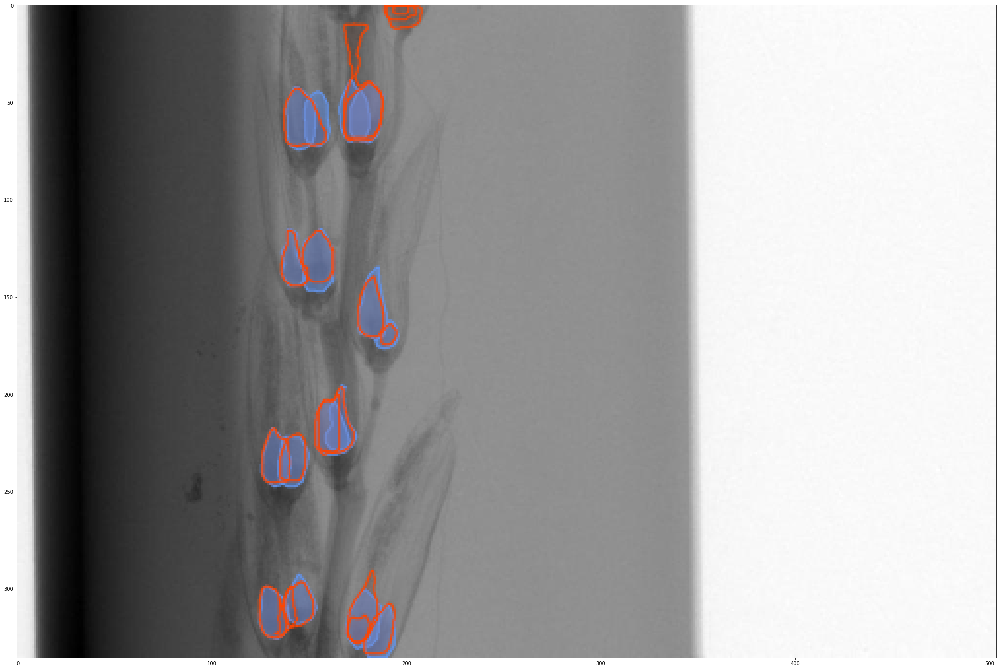

Calculating IoU for image 5 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/gt1_p_test2-0100000009_jpg.rf.d0babb4dbaae610b1d09fc1f33f8644d.jpg
Individual mask IoUs [0.8047039059218816, 0.8401875901875901, 0.6448730009407337, 0.9181994191674734, 0.7096370463078848, 0.8970271434726411, 0.5774647887323944, 0.4544846050870147, 0.49435382685069007, 0, 0.47017543859649125, 0, 0, 0, 0.40336134453781514, 0.36929460580912865, 0, 0.30985915492957744, 0.2711864406779661, 0.16911764705882354, 0.012539184952978056, 0, 0, 0.44370860927152317, 0.40293040293040294, 0, 0.16083916083916083, 0, 0, 0]
Mean IoU for image 0.31179811054240575


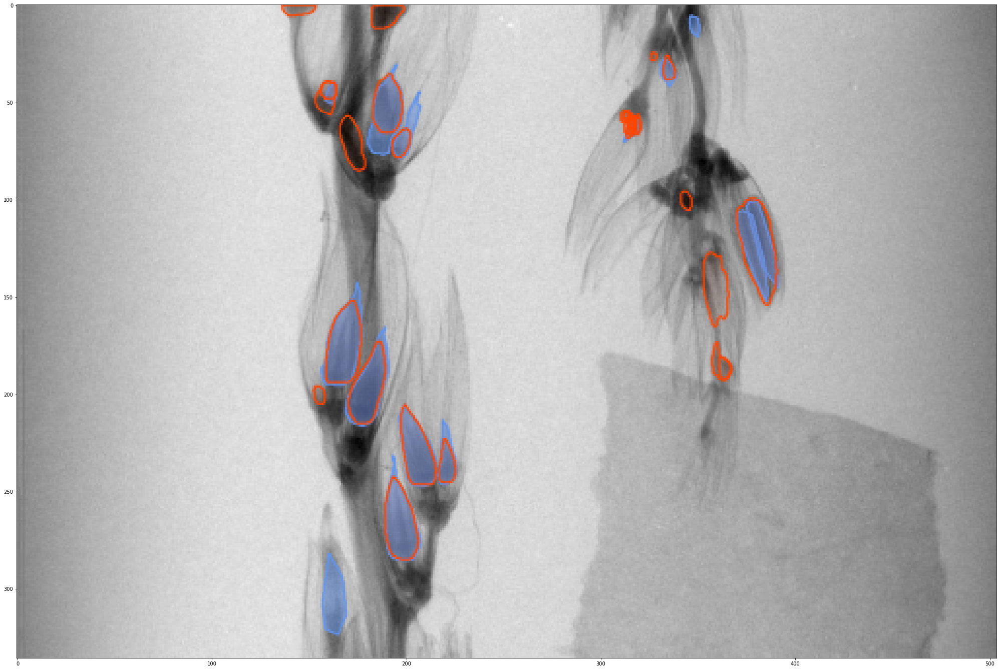

Calculating IoU for image 6 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/448-1-0000000009_jpg.rf.301981808095b6ea116a9aff67a3fc1e.jpg
Individual mask IoUs [0.8813397129186603, 0.9095238095238095, 0.9078408425980106, 0.9202574146614437, 0.753255895811334, 0, 0.6481709823263461, 0.019225251076040173, 0.643698468786808, 0]
Mean IoU for image 0.5683312377702452


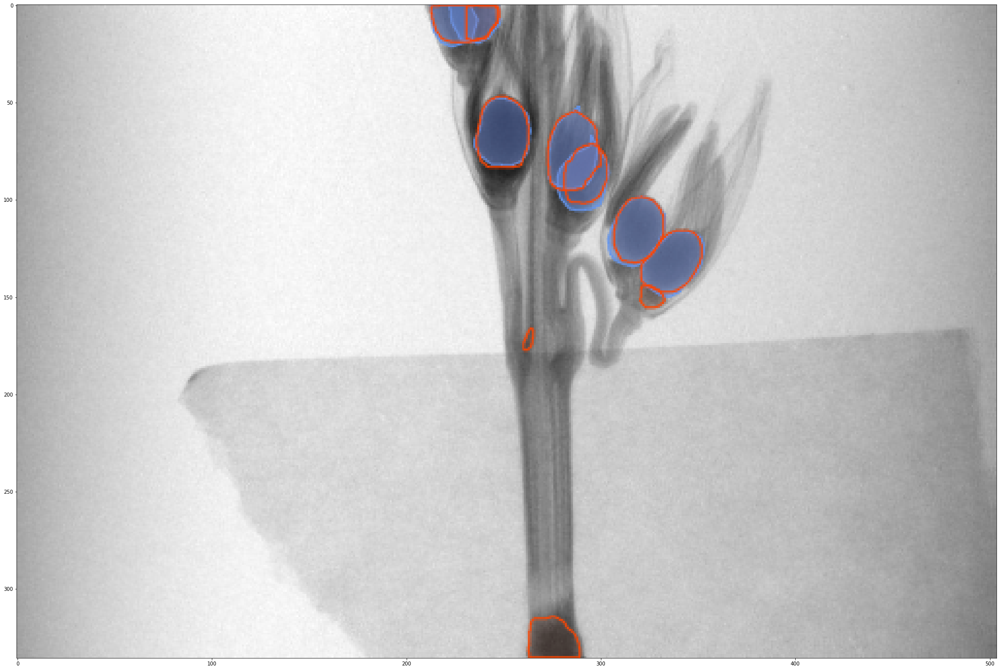

Calculating IoU for image 7 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/gt1_p_test2-0400000008_jpg.rf.595f83e9d3a09f9e7274ef68d9e7aab4.jpg
Individual mask IoUs [0.8603696098562629, 0.8831667947732513, 0.7328165374677003, 0.7565104166666666, 0.4540059347181009, 0.47778454047474134, 0, 0, 0.7805171377029465, 0.7189610389610389, 0.40808344198174706, 0.8099808061420346, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.532319391634981, 0, 0, 0, 0.655421686746988, 0.654320987654321]
Mean IoU for image 0.2077204363043043


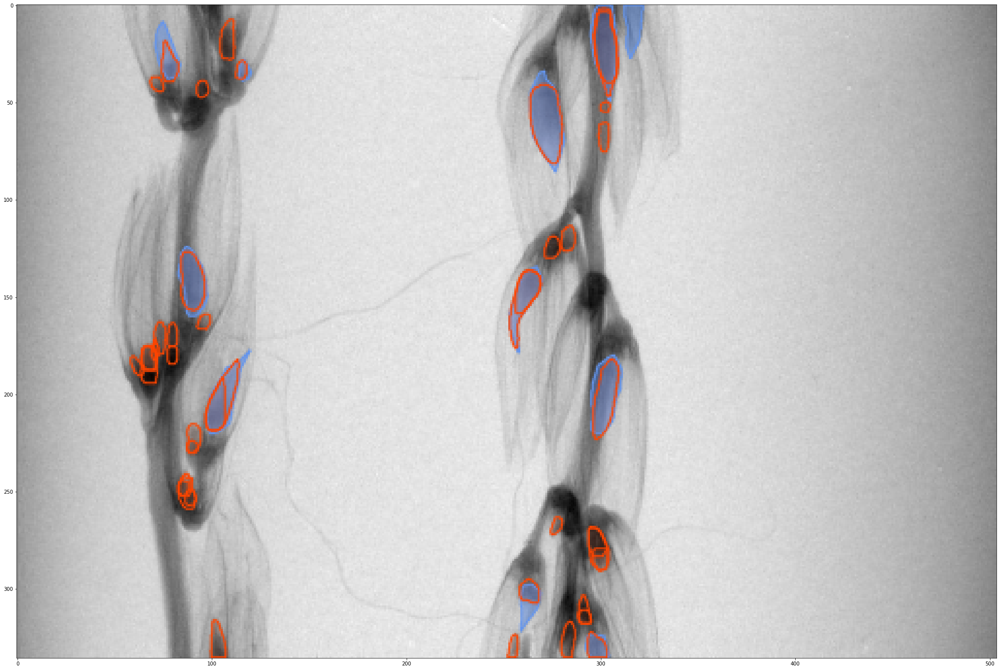

Calculating IoU for image 8 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/gt1_p_test2-0100000008_jpg.rf.dc39e920a3a7b4ea8d71232c3fb6d98a.jpg
Individual mask IoUs [0.8769922353902738, 0.8439059158945118, 0.7988439306358381, 0.8600842302292934, 0.8035178035178036, 0.8373816385343763, 0.6295264623955432, 0, 0.27746947835738067, 0.2911931818181818, 0, 0, 0.4724180837826628, 0, 0, 0.16407832545577314, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Mean IoU for image 0.2636696648466015


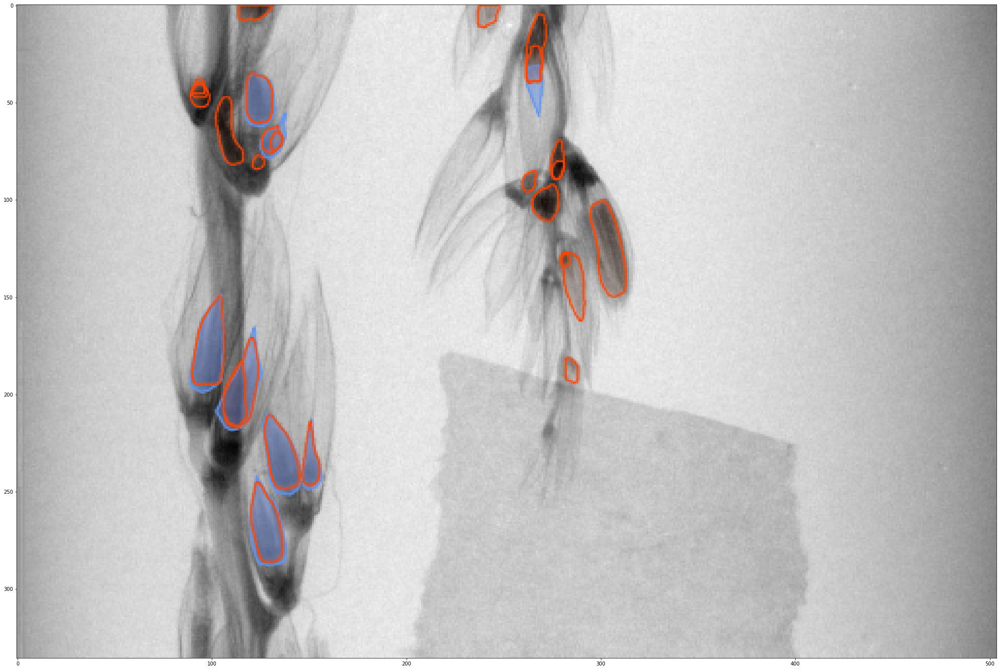

Calculating IoU for image 9 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/402-2-0500000008_jpg.rf.1fb38fd55ee703022e3ef7b44747178a.jpg
Individual mask IoUs [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Mean IoU for image 0.0


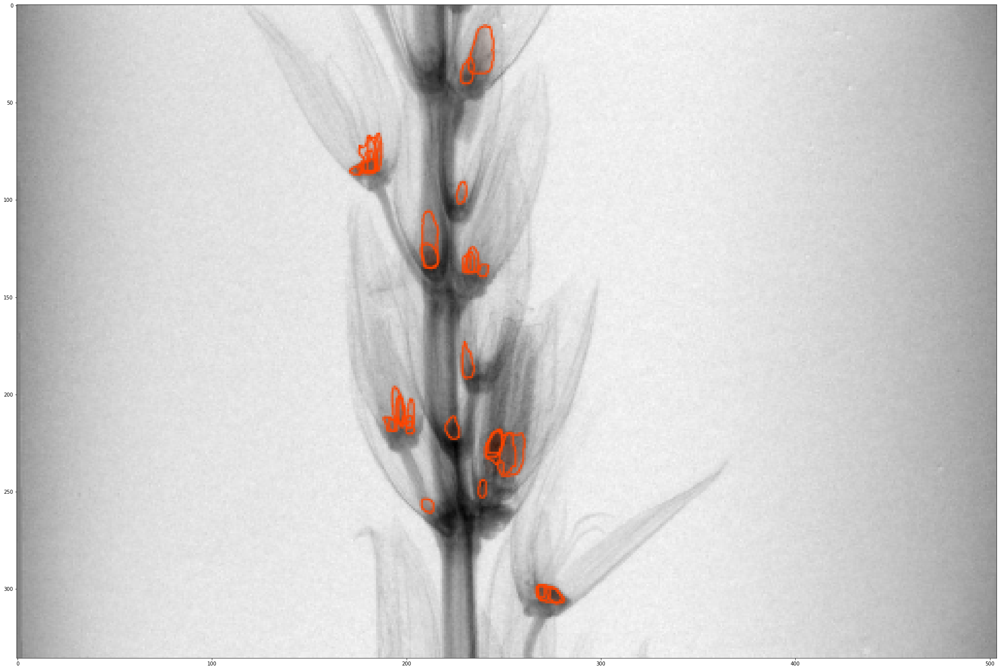

Calculating IoU for image 10 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/409-4-0200000009_jpg.rf.1f983c045c9cda1d6b8cf857f4a3dbed.jpg
Individual mask IoUs [0.9059312429165093, 0.8472834067547724, 0.895069033530572, 0.8830107526881721, 0.9332794177112819, 0.8909166321028619, 0.8947368421052632, 0.9455948030856679, 0.8584298584298584, 0.8216463414634146, 0.938677179150241, 0.838909541511772, 0.8759004584151932, 0.8504003371260008, 0.9067234848484849, 0.7478849407783418, 0.8512476007677543, 0.9116733244562805, 0.8817204301075269, 0.8922800718132855, 0.67911434236616, 0.8513425016371972, 0.3624517374517375, 0.5239335721263432, 0.8912516823687753, 0.7692307692307693, 0.23235383217206906, 0.8529106029106029, 0.8890276538804639, 0.7760279965004374, 0.4222512600336009, 0.715154146765089, 0.08957161401990481, 0.4055023923444976, 0.18225419664268586, 0.31802120141342755, 0.45295404814004375, 0.6384848484848484, 0.28955797565

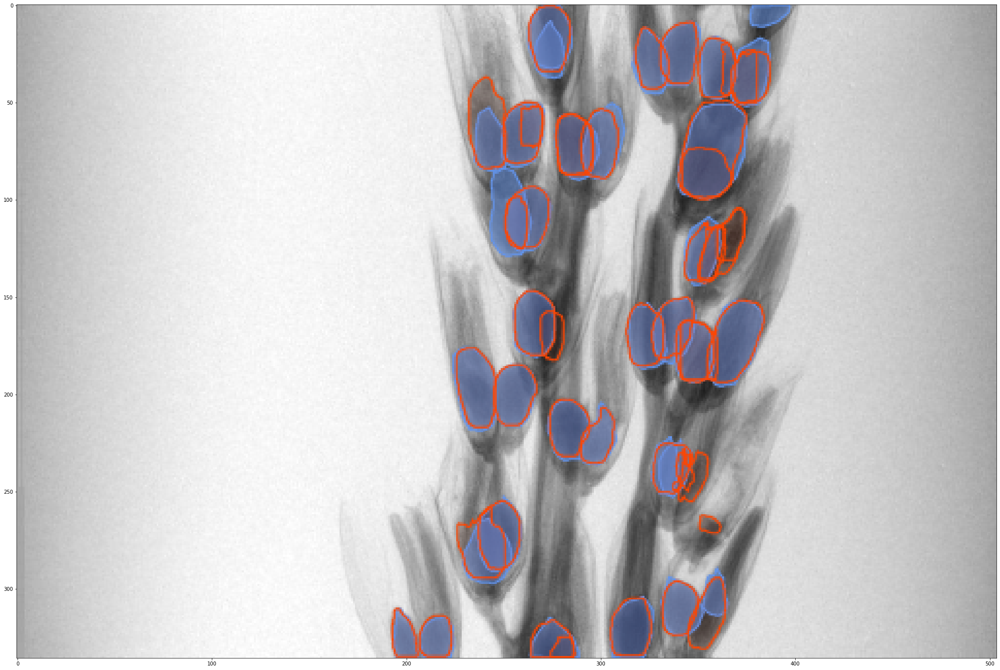

Calculating IoU for image 11 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/405-8-0800000009_jpg.rf.4d244c78b6cc2376af24bdc96a2b0e06.jpg
Individual mask IoUs [0.9338235294117647, 0.9043963712491278, 0.9207389749702026, 0.8211856171039844, 0.9107981220657277, 0.8463438735177866, 0.8907014681892332, 0.8696711327649208, 0.8595253367543297, 0.9413524835427888, 0.9287991498405951, 0.8318042813455657, 0.8924015529672767, 0.9001593202336696, 0.9359110169491526, 0.933606184629377, 0.7609756097560976, 0.8177233429394812, 0.8056506849315068, 0.8584615384615385, 0.8513876454789615, 0.6085171883016932, 0.5666235446313066, 0, 0.024780785360274494, 0, 0.5042462845010616]
Mean IoU for image 0.7451698162924971


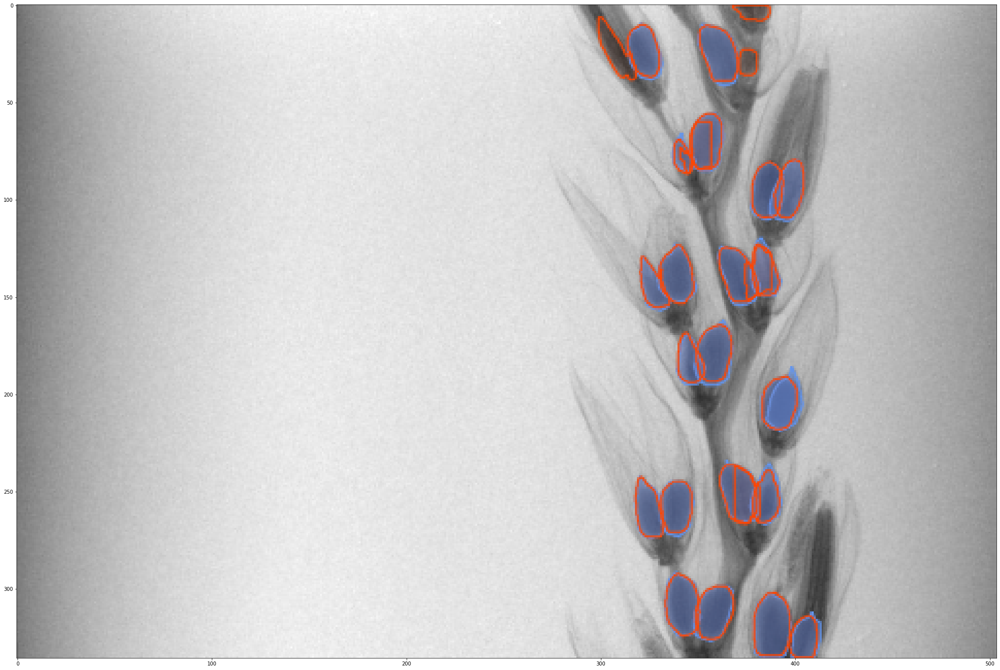

Calculating IoU for image 12 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/409-6-0200000009_jpg.rf.ea60541b8a493b941c4e03a59fa0fd0c.jpg
Individual mask IoUs [0.874390243902439, 0.8841463414634146, 0.8513429106808245, 0.9459207459207459, 0.9192924267551134, 0.8835758835758836, 0.9063242986210176, 0.8473377703826955, 0.9239653512993262, 0.8882500898311175, 0.88001638001638, 0.909432387312187, 0.9187628865979381, 0.7437455325232308, 0.8881644934804414, 0.8955696202531646, 0.842832469775475, 0.8960446247464503, 0.8751238850346879, 0.9397715472481828, 0.8800639658848614, 0.9007792207792208, 0.9276672694394213, 0.8795061728395062, 0.8980061349693251, 0.8196218702095044, 0.8644884841992502, 0.9329529243937232, 0.8049095607235142, 0.9266666666666666, 0.9090909090909091, 0.22860858257477243, 0.8838278311742582, 0.8965282505105514, 0.9075268817204301, 0.8719851576994434, 0.7703349282296651, 0.5635023840485479, 0.81404628890662

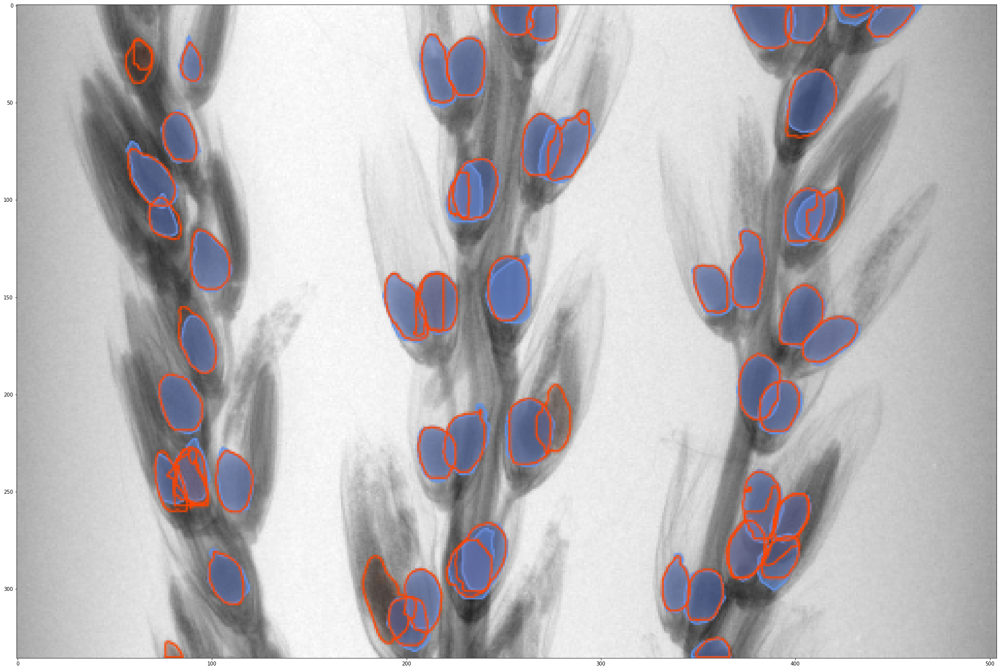

Calculating IoU for image 13 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/gt1_p_test2-0600000009_jpg.rf.21fb07aea6fed76f3c4ff90b9c997767.jpg
Individual mask IoUs [0.7669902912621359, 0.8568464730290456, 0.5547703180212014, 0.7271019257867544, 0, 0.09077878643096035, 0.8813838550247117, 0, 0.4132841328413284, 0, 0, 0.7564553990610329, 0.05633124699085219, 0.12458073790129372, 0.10231660231660232, 0, 0.06401137980085349, 0.7621359223300971, 0.844804318488529, 0.30864787386526515, 0.5515151515151515, 0, 0.31382978723404253, 0.40601503759398494, 0.5123456790123457, 0, 0, 0.5314685314685315, 0.11052123552123552, 0.6487804878048781, 0, 0, 0.22558459422283356, 0, 0, 0.22413793103448276, 0, 0]
Mean IoU for image 0.2851220446988987


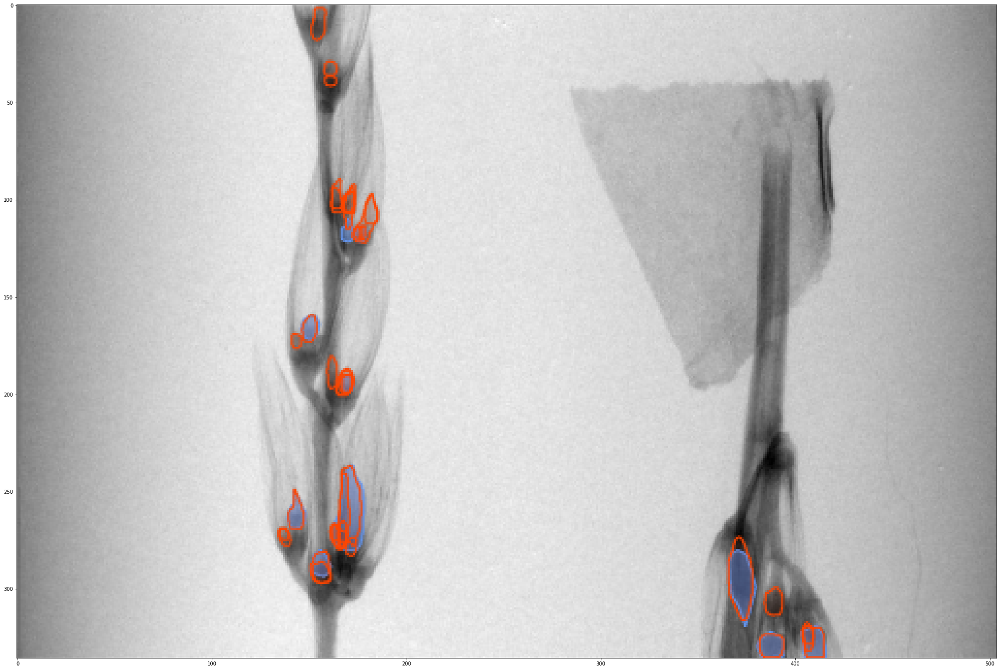

Calculating IoU for image 14 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/154-8-0700000009_jpg.rf.26c77b94e7116baeb801f4bf7febd40b.jpg
Individual mask IoUs [0.8758169934640523, 0.8673230192217534, 0.8805542283803154, 0.9004424778761062, 0.5491009681881052, 0.8588526619892695, 0.8623771224307417, 0.7877697841726619, 0.749636803874092, 0.8437110834371109, 0.8882657463330458, 0.8194054963544588, 0.8456973293768546, 0.5700586041555674, 0.7376623376623377, 0.11890925346446134, 0.5344262295081967, 0.35579883681149505, 0.05555555555555555]
Mean IoU for image 0.6895455016976937


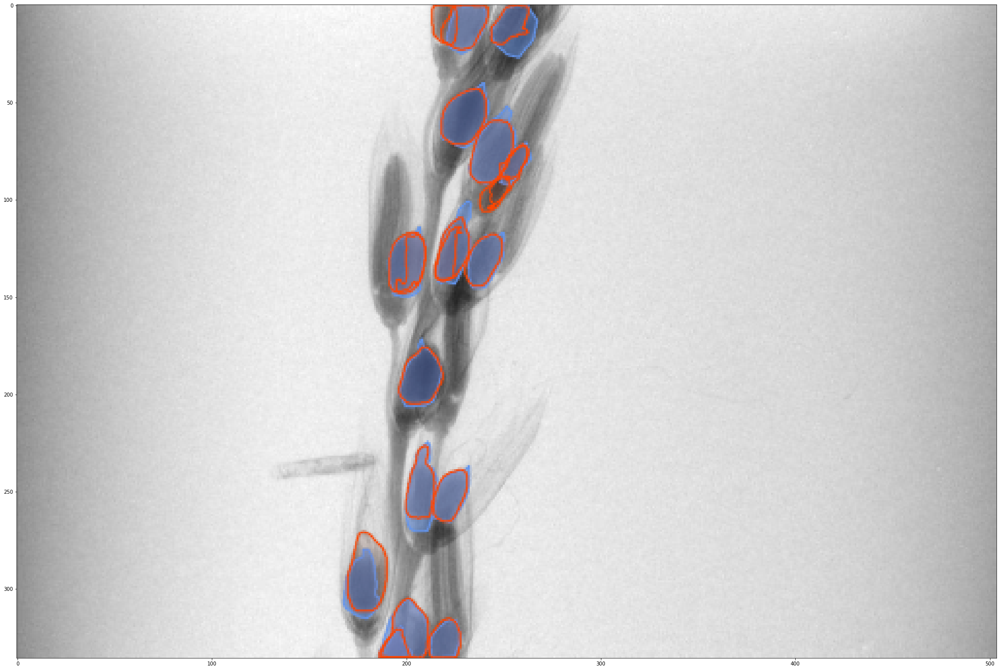

Calculating IoU for image 15 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/155-6-0000000008_jpg.rf.5433393d3146cf16e808b420fd33680a.jpg
Individual mask IoUs [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Mean IoU for image 0.0


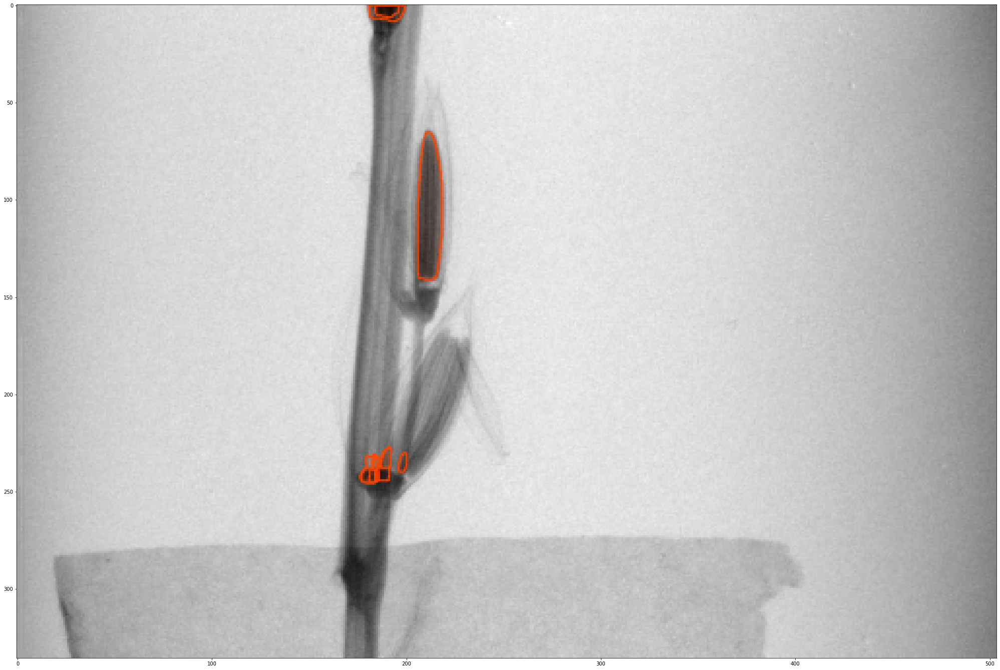

Calculating IoU for image 16 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/gt1_p_test2-0000000009_jpg.rf.47e74146f3a941ac1d10cc7b300968cb.jpg


In [ ]:
#merged, no conf threshold
type_metadata = MetadataCatalog.get("test_maize_specific")
datasetDict = DatasetCatalog.get("test_maize_specific")
conf, ious, totalGt = calcTestsetMaskIoU(datasetDict)

In [ ]:
calcPRIous(conf, ious, totalGt, "precision_recall")

## threshold @ .82

In [12]:
#setting conf threshold to .82 to prioritize higher iou segmentations
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.82

[07/01 17:15:28 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

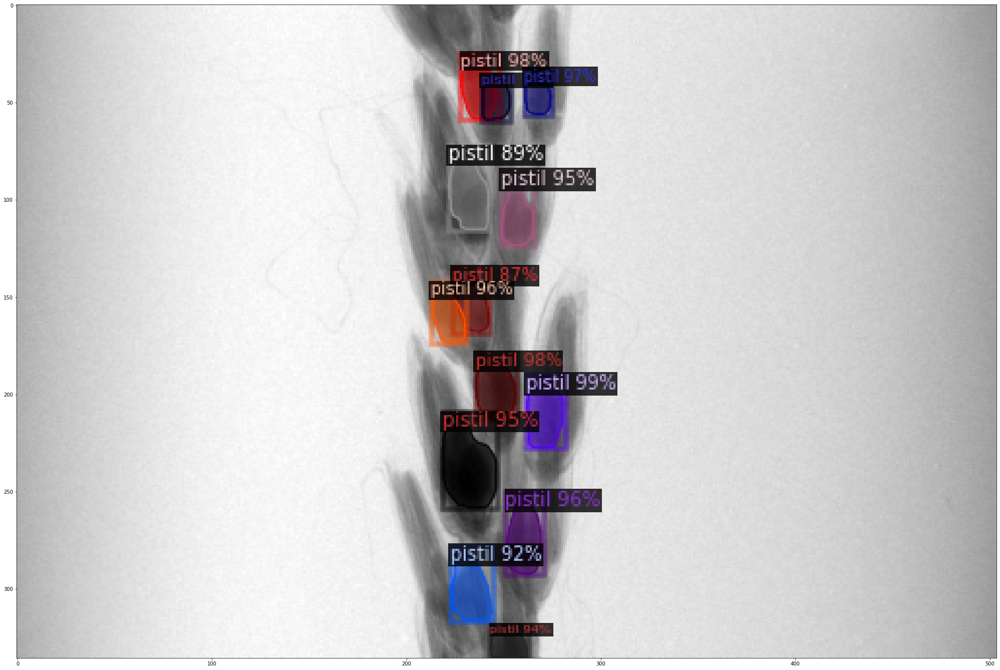

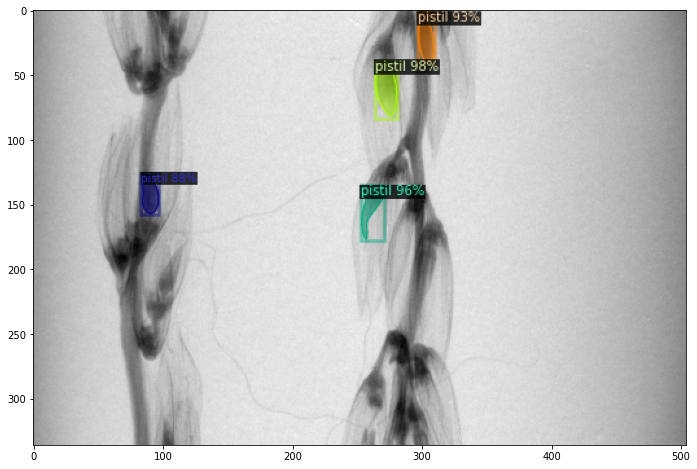

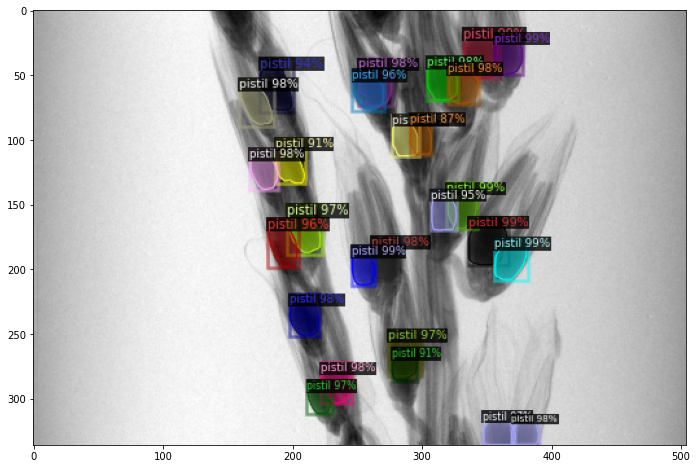

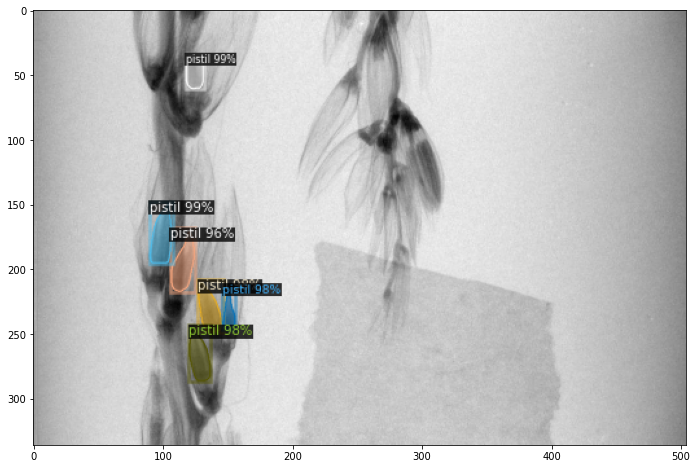

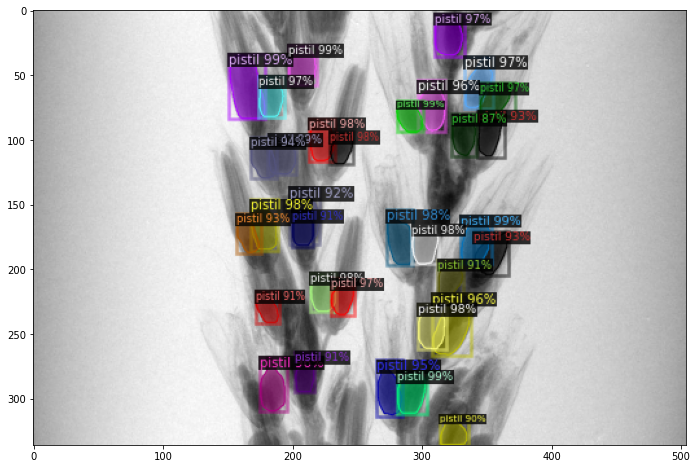

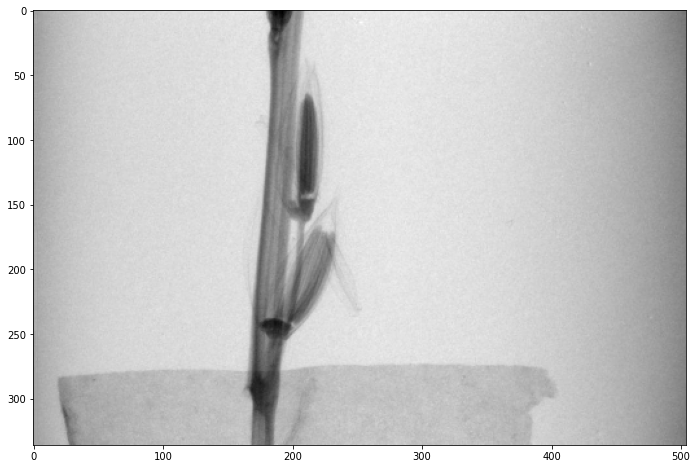

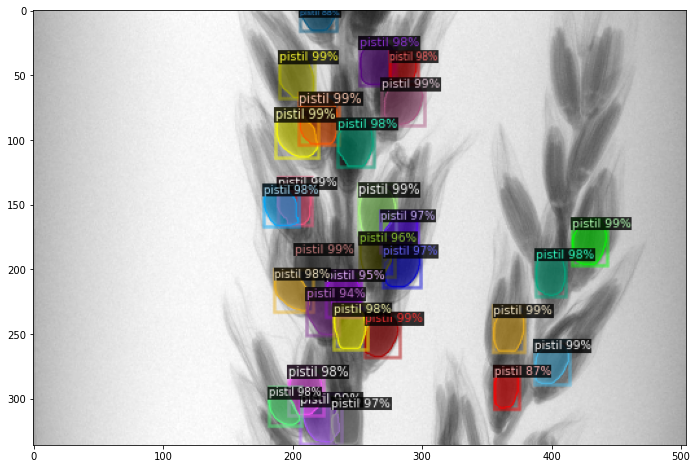

In [13]:
#run test evaluation with new cutoff

predictor = DefaultPredictor(cfg)

from detectron2.utils.visualizer import ColorMode
for d in random.sample(datasetDict, 7):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=type_metadata, scale=0.5, instance_mode=ColorMode.SEGMENTATION)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.imshow(out.get_image())
    plt.rcParams['figure.figsize'] = [12, 8]
    plt.show()

## calculate IoU with .82 confidence threshold

[07/01 17:15:59 d2.data.datasets.coco]: Loaded 25 images in COCO format from /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/_annotations.coco.json
Calculating IoU for image 0 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/ra3gt1_4_-0500000002_jpg.rf.4782b9579be52e47059b9fca9a5f4836.jpg
Individual mask IoUs [0.8708260105448155, 0.9048128342245989, 0.7238938053097345, 0.7009109311740891, 0.8427773343974462, 0.8871308016877637, 0.7088055797733217, 0, 0.7637130801687764]
Mean IoU for image 0.7114300419200607


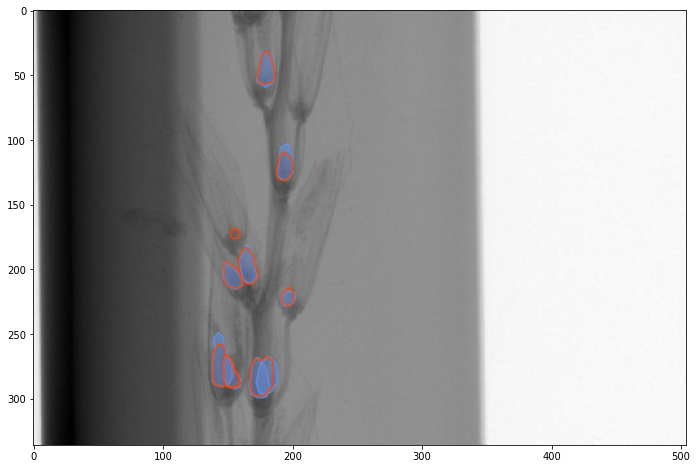

Calculating IoU for image 1 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/gt1_p_test2-0400000009_jpg.rf.a288ad45f53fdba49de4ed779b39bf48.jpg
Individual mask IoUs [0.7842876165113183, 0.6896551724137931, 0.6036585365853658, 0.6923076923076923, 0.9448094612352168, 0.8569321533923304, 0.6179245283018868]
Mean IoU for image 0.7413678801068005


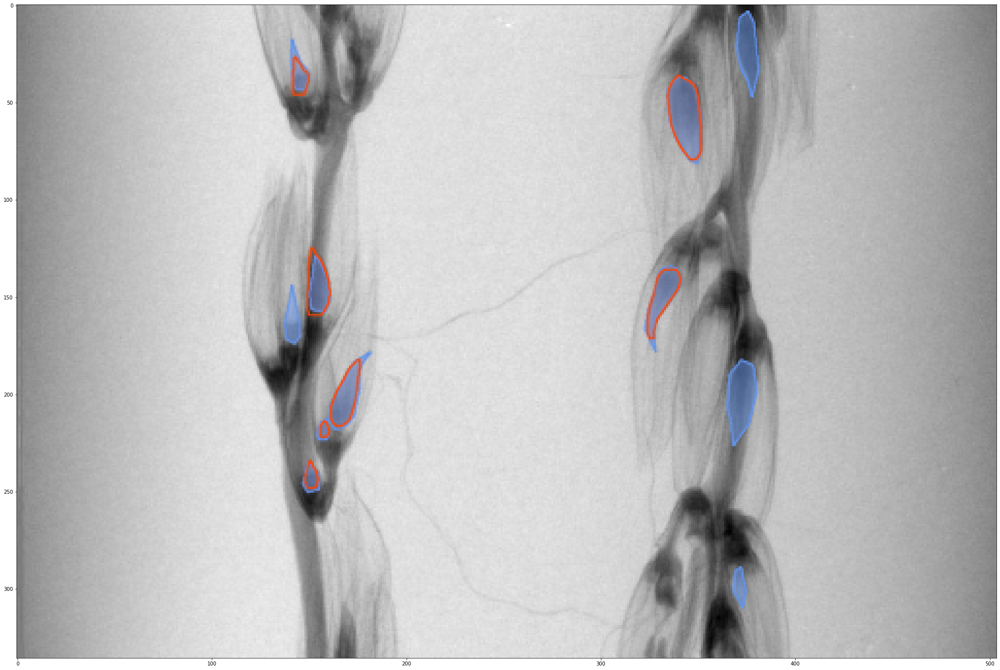

Calculating IoU for image 2 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/158-2-0500000009_jpg.rf.0c0685738532432ef12b976db2e6a970.jpg
Individual mask IoUs [0.8770843258694616, 0.9470954356846473, 0.8875219683655536, 0.8824921135646687, 0.9277857484457197, 0.9361252115059222, 0.9095975232198142, 0.850784230606189, 0.6709633649932157, 0.8243243243243243, 0.8490945674044266, 0.8141643059490085, 0.5814497272018706, 0.8706577974870657]
Mean IoU for image 0.8449386174729919


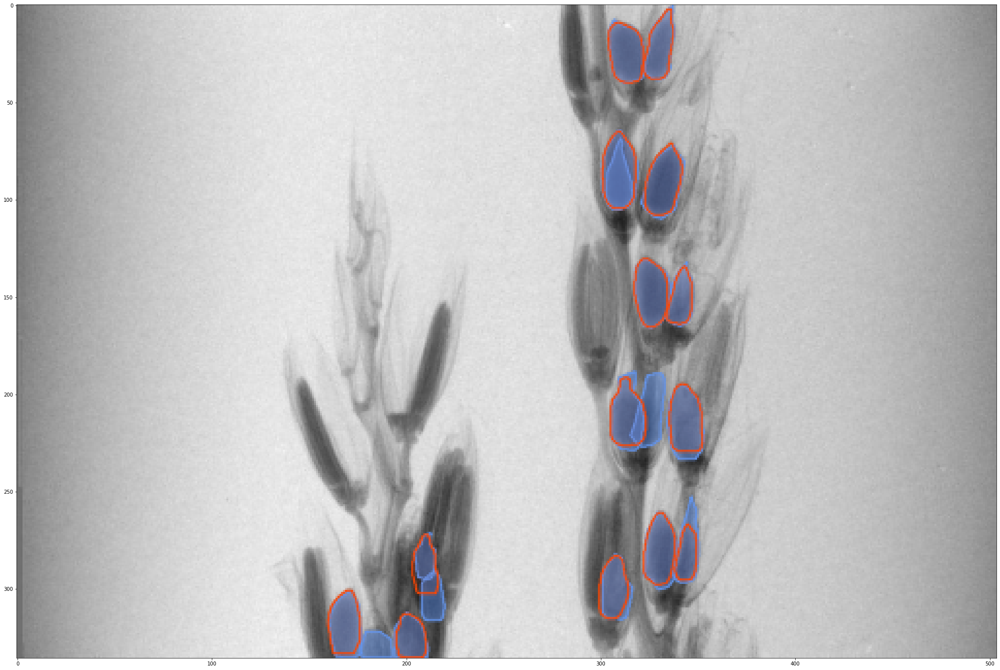

Calculating IoU for image 3 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/158-10-0200000009_jpg.rf.177c5bb0e1d2ede884a2c5a85f925f43.jpg
Individual mask IoUs [0.8755129958960328, 0.8803874092009685, 0.8690476190476191, 0.8960931005818786, 0.8687329079307201, 0.8952380952380953, 0.862051282051282, 0.8374363327674024, 0.9126344086021505, 0.9264091858037579, 0.8856897292651482, 0.9025641025641026, 0.8514285714285714, 0.8654314968308142, 0.819089207735496, 0.8871614844533601, 0.7867278797996661, 0.9298845660538692, 0.8308856252781487, 0.7779531109107304, 0.9062237174095878, 0.9060402684563759, 0.7841269841269841, 0.7767137096774194, 0.7880220646178093, 0.7586402266288952, 0.877262964099417, 0.562049062049062, 0.8376891334250344, 0.7028061224489796, 0.8023553507424476, 0.8374384236453202, 0.8658070678127985]
Mean IoU for image 0.8413798244418166


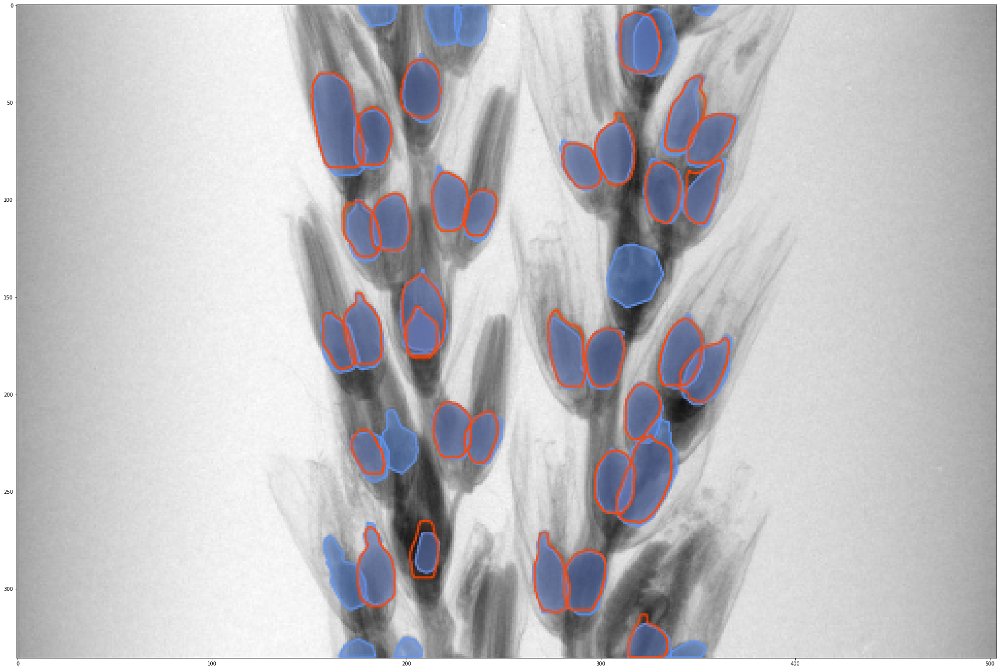

Calculating IoU for image 4 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/ra3gt1_4_-0400000002_jpg.rf.088f2de33fb37afc92756bd980d0b58b.jpg
Individual mask IoUs [0.7796901893287436, 0.752851711026616, 0.7097938144329897, 0.8300359712230215, 0.7538538040775733, 0.7919463087248322, 0.7619047619047619, 0.8498862774829417, 0.7801418439716312, 0.8871085214857976, 0.6681081081081081, 0.7628571428571429]
Mean IoU for image 0.7773482045520134


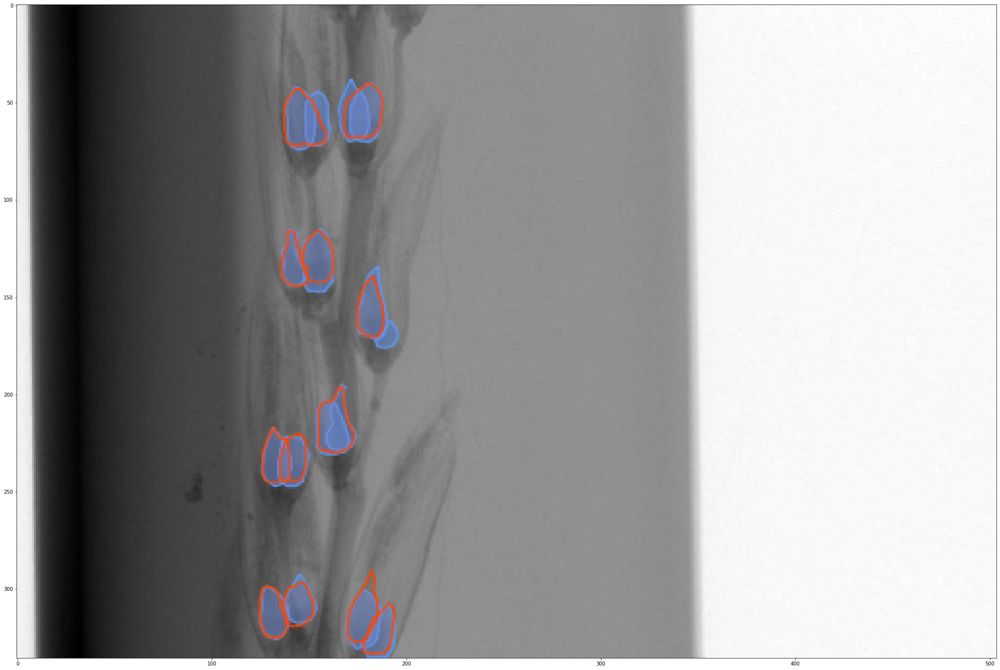

Calculating IoU for image 5 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/gt1_p_test2-0100000009_jpg.rf.d0babb4dbaae610b1d09fc1f33f8644d.jpg
Individual mask IoUs [0.8047039059218816, 0.8401875901875901, 0.6448730009407337, 0.9181994191674734, 0.7096370463078848, 0.8970271434726411]
Mean IoU for image 0.8024380176663675


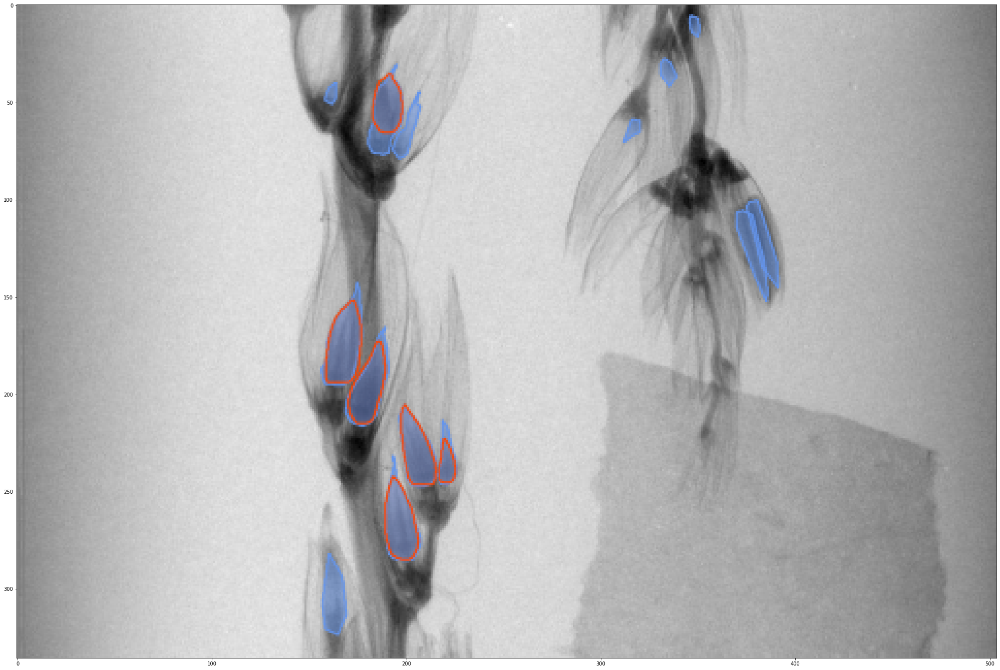

Calculating IoU for image 6 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/448-1-0000000009_jpg.rf.301981808095b6ea116a9aff67a3fc1e.jpg
Individual mask IoUs [0.8813397129186603, 0.9095238095238095, 0.9078408425980106, 0.9202574146614437, 0.753255895811334, 0, 0.6481709823263461]
Mean IoU for image 0.717198379691372


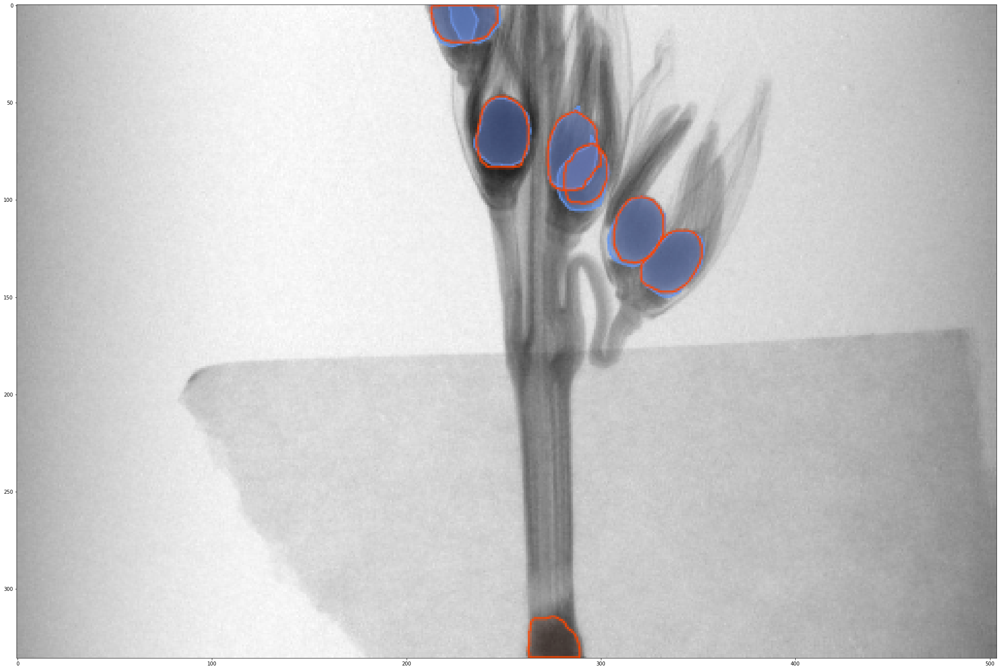

Calculating IoU for image 7 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/gt1_p_test2-0400000008_jpg.rf.595f83e9d3a09f9e7274ef68d9e7aab4.jpg
Individual mask IoUs [0.8603696098562629, 0.8831667947732513, 0.7328165374677003, 0.7565104166666666]
Mean IoU for image 0.8082158396909702


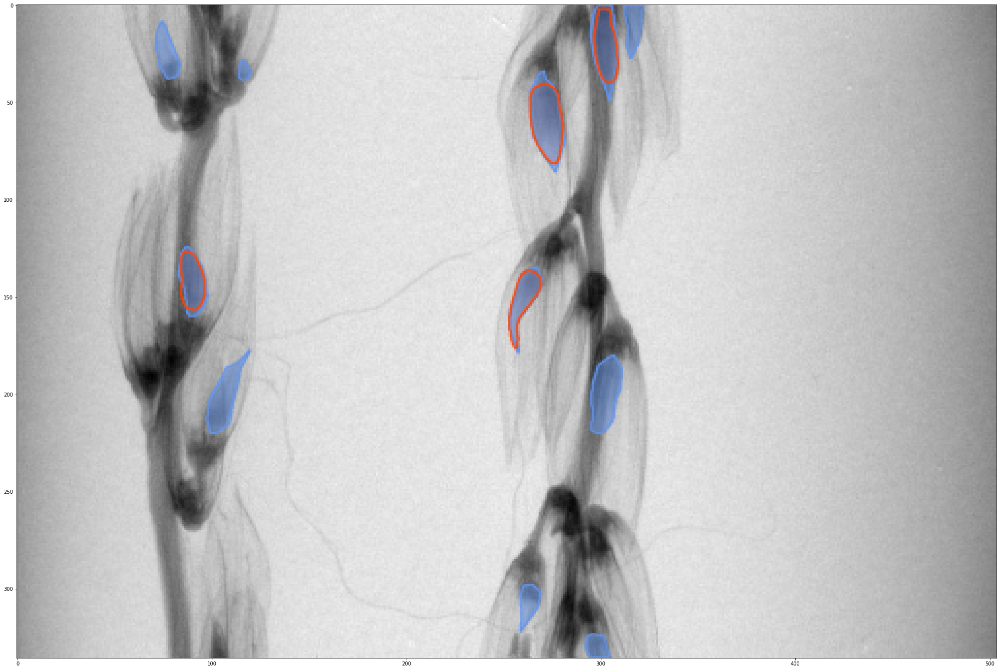

Calculating IoU for image 8 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/gt1_p_test2-0100000008_jpg.rf.dc39e920a3a7b4ea8d71232c3fb6d98a.jpg
Individual mask IoUs [0.8769922353902738, 0.8439059158945118, 0.7988439306358381, 0.8600842302292934, 0.8035178035178036, 0.8373816385343763]
Mean IoU for image 0.8367876257003495


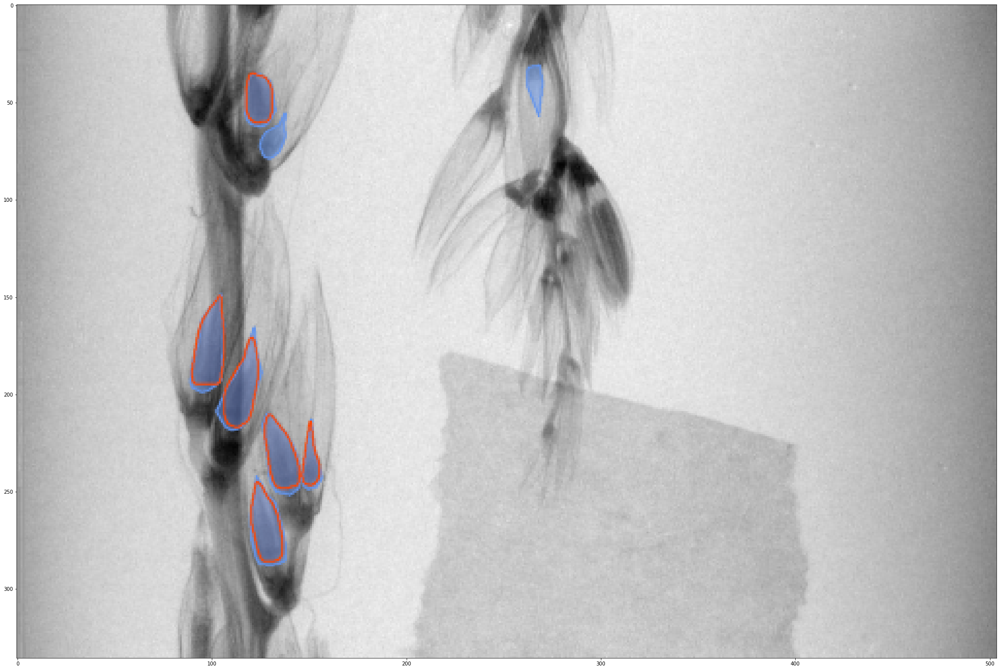

Calculating IoU for image 9 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/402-2-0500000008_jpg.rf.1fb38fd55ee703022e3ef7b44747178a.jpg
Individual mask IoUs [0, 0]
Mean IoU for image 0.0


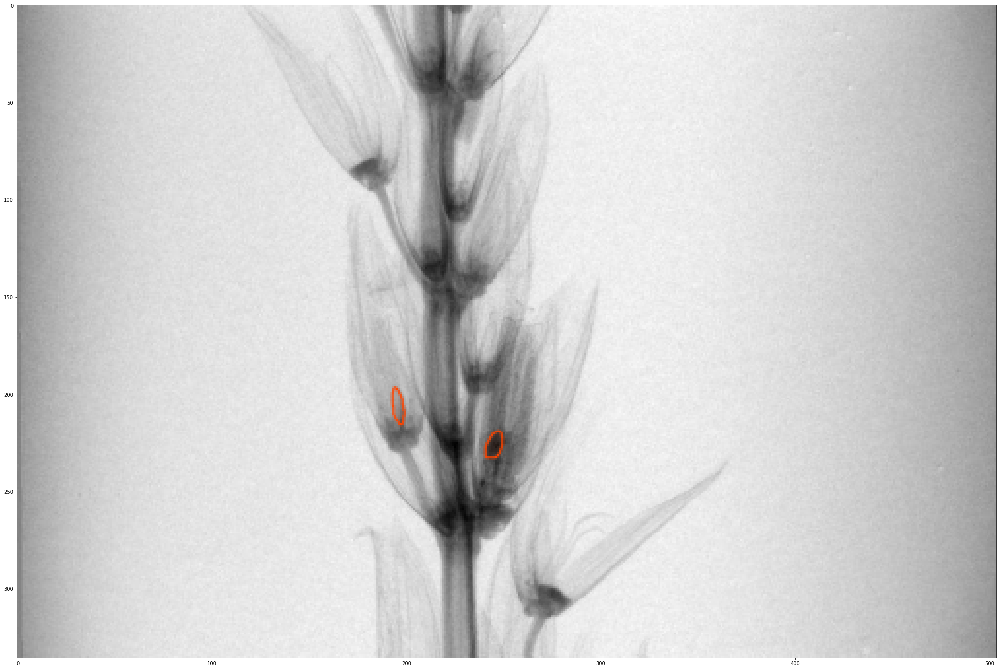

Calculating IoU for image 10 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/409-4-0200000009_jpg.rf.1f983c045c9cda1d6b8cf857f4a3dbed.jpg
Individual mask IoUs [0.9059312429165093, 0.8472834067547724, 0.895069033530572, 0.8830107526881721, 0.9332794177112819, 0.8909166321028619, 0.8947368421052632, 0.9455948030856679, 0.8584298584298584, 0.8216463414634146, 0.938677179150241, 0.838909541511772, 0.8759004584151932, 0.8504003371260008, 0.9067234848484849, 0.7478849407783418, 0.8512476007677543, 0.9116733244562805, 0.8817204301075269, 0.8922800718132855, 0.67911434236616, 0.8513425016371972, 0.3624517374517375, 0.5239335721263432, 0.8912516823687753, 0.7692307692307693, 0.23235383217206906, 0.8529106029106029, 0.8890276538804639]
Mean IoU for image 0.8145838756519785


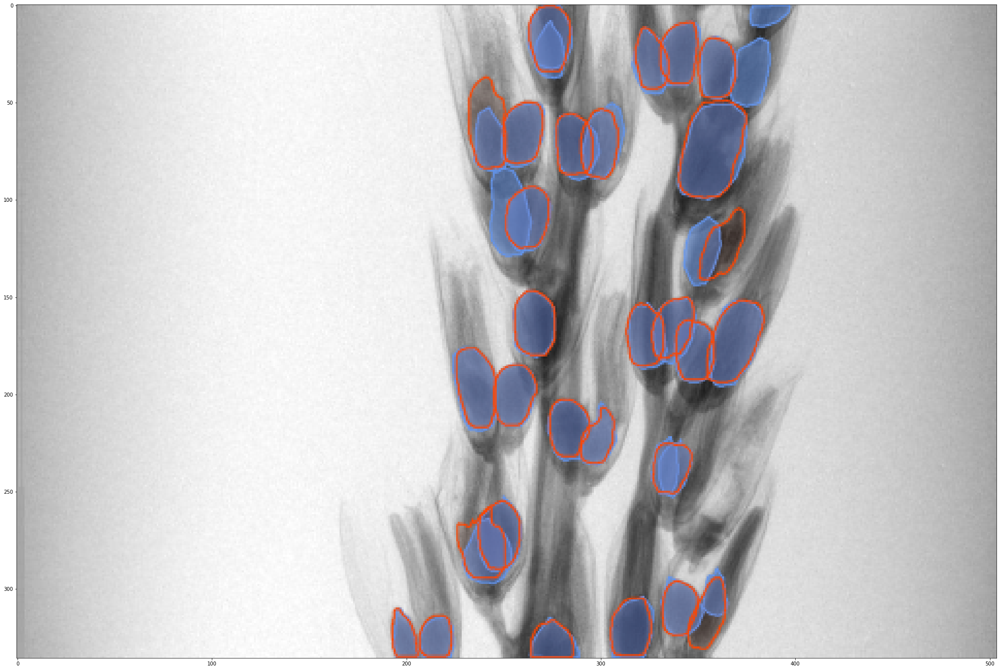

Calculating IoU for image 11 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/405-8-0800000009_jpg.rf.4d244c78b6cc2376af24bdc96a2b0e06.jpg
Individual mask IoUs [0.9338235294117647, 0.9043963712491278, 0.9207389749702026, 0.8211856171039844, 0.9107981220657277, 0.8463438735177866, 0.8907014681892332, 0.8696711327649208, 0.8595253367543297, 0.9413524835427888, 0.9287991498405951, 0.8318042813455657, 0.8924015529672767, 0.9001593202336696, 0.9359110169491526, 0.933606184629377, 0.7609756097560976, 0.8177233429394812, 0.8056506849315068, 0.8584615384615385, 0.8513876454789615]
Mean IoU for image 0.8769246303382423


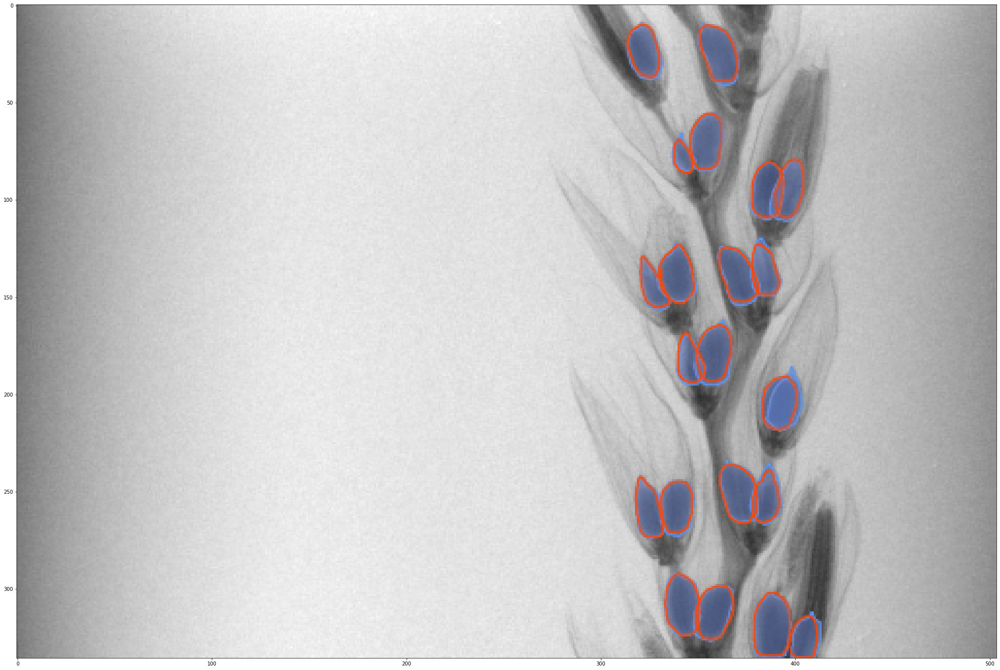

Calculating IoU for image 12 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/409-6-0200000009_jpg.rf.ea60541b8a493b941c4e03a59fa0fd0c.jpg
Individual mask IoUs [0.874390243902439, 0.8841463414634146, 0.8513429106808245, 0.9459207459207459, 0.9192924267551134, 0.8835758835758836, 0.9063242986210176, 0.8473377703826955, 0.9239653512993262, 0.8882500898311175, 0.88001638001638, 0.909432387312187, 0.9187628865979381, 0.7437455325232308, 0.8881644934804414, 0.8955696202531646, 0.842832469775475, 0.8960446247464503, 0.8751238850346879, 0.9397715472481828, 0.8800639658848614, 0.9007792207792208, 0.9276672694394213, 0.8795061728395062, 0.8980061349693251, 0.8196218702095044, 0.8644884841992502, 0.9329529243937232, 0.8049095607235142, 0.9266666666666666, 0.9090909090909091, 0.22860858257477243, 0.8838278311742582, 0.8965282505105514, 0.9075268817204301, 0.8719851576994434, 0.7703349282296651, 0.5635023840485479, 0.81404628890662

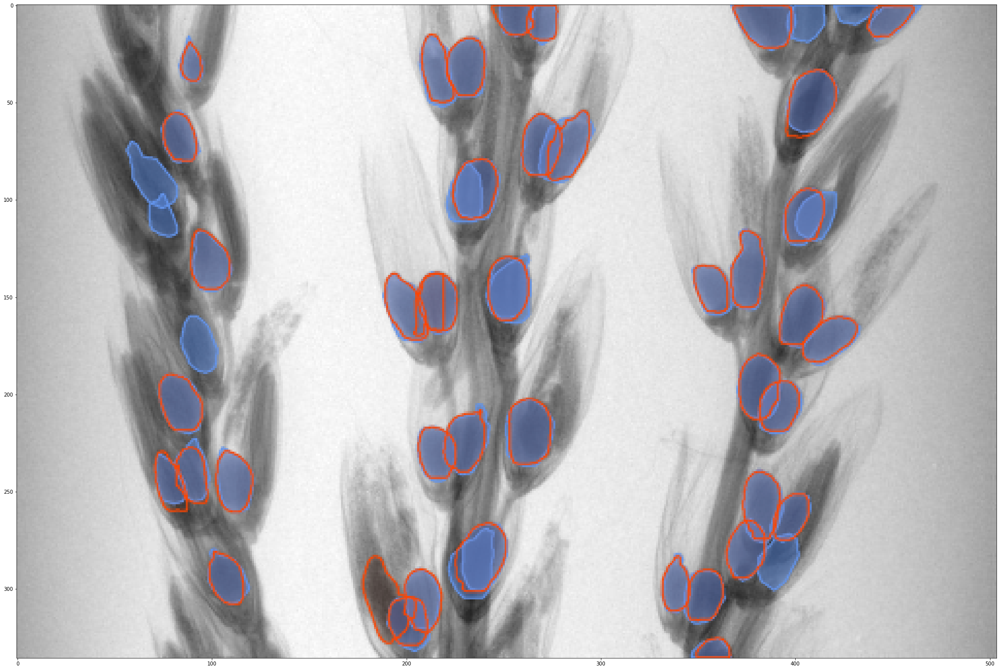

Calculating IoU for image 13 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/gt1_p_test2-0600000009_jpg.rf.21fb07aea6fed76f3c4ff90b9c997767.jpg
Individual mask IoUs [0.7669902912621359, 0.8568464730290456, 0.5547703180212014, 0.7271019257867544]
Mean IoU for image 0.7264272520247843


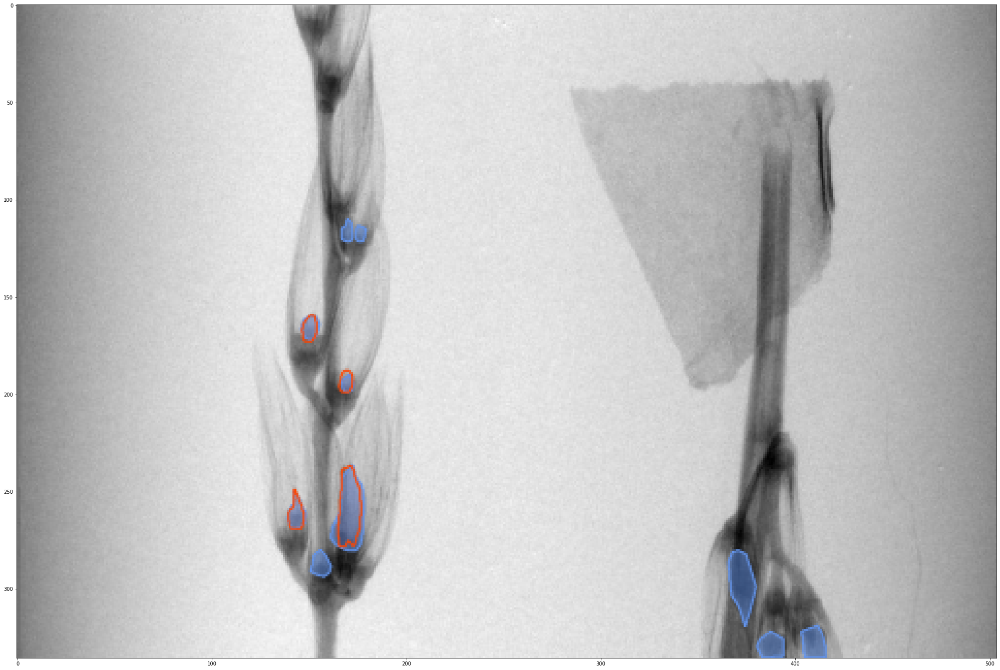

Calculating IoU for image 14 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/154-8-0700000009_jpg.rf.26c77b94e7116baeb801f4bf7febd40b.jpg
Individual mask IoUs [0.8758169934640523, 0.8673230192217534, 0.8805542283803154, 0.9004424778761062, 0.5491009681881052, 0.8588526619892695, 0.8623771224307417, 0.7877697841726619, 0.749636803874092, 0.8437110834371109, 0.8882657463330458, 0.8194054963544588]
Mean IoU for image 0.8236046988101428


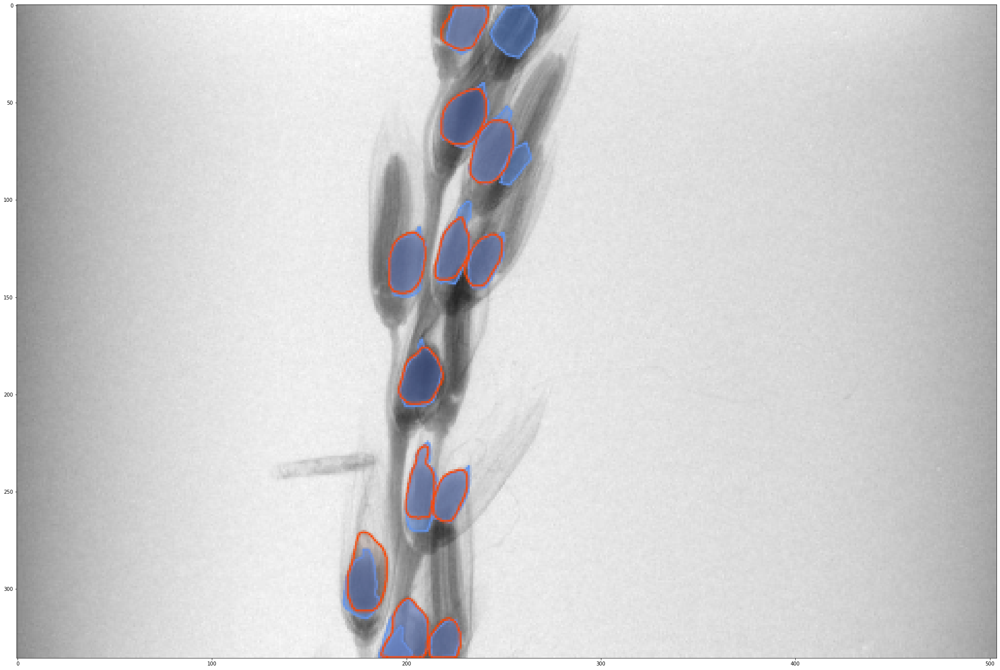

Calculating IoU for image 15 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/155-6-0000000008_jpg.rf.5433393d3146cf16e808b420fd33680a.jpg
Individual mask IoUs []
Mean IoU for image nan


/usr/local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


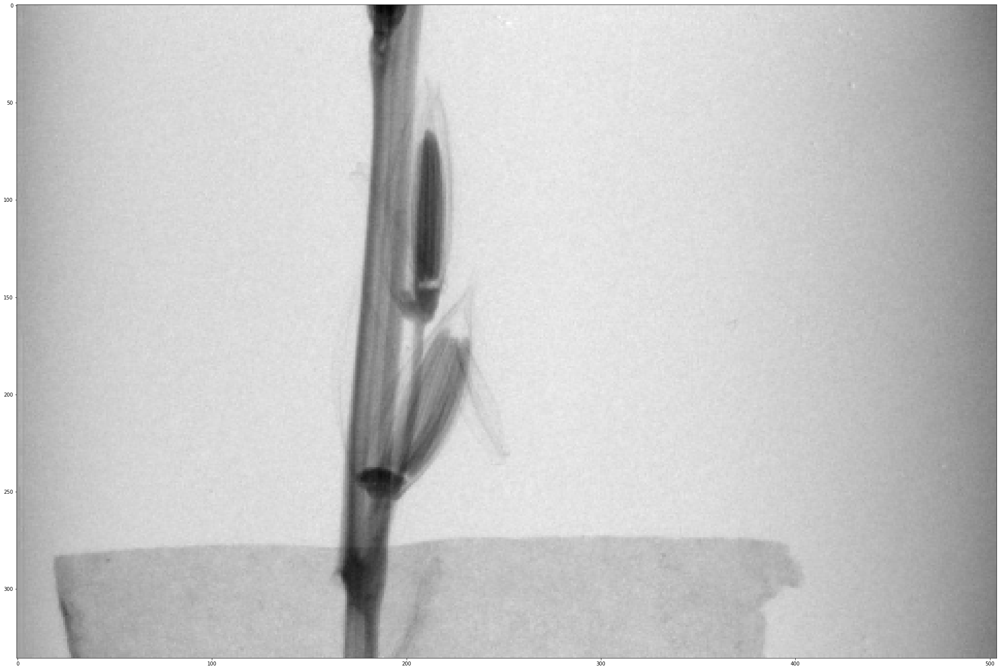

Calculating IoU for image 16 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/gt1_p_test2-0000000009_jpg.rf.47e74146f3a941ac1d10cc7b300968cb.jpg
Individual mask IoUs [0.8174651303820497, 0.8471726948548141, 0.7868852459016393, 0.8555203380876915, 0.9143540669856459, 0.8717409587888982, 0.8167808219178082]
Mean IoU for image 0.8442741795597923


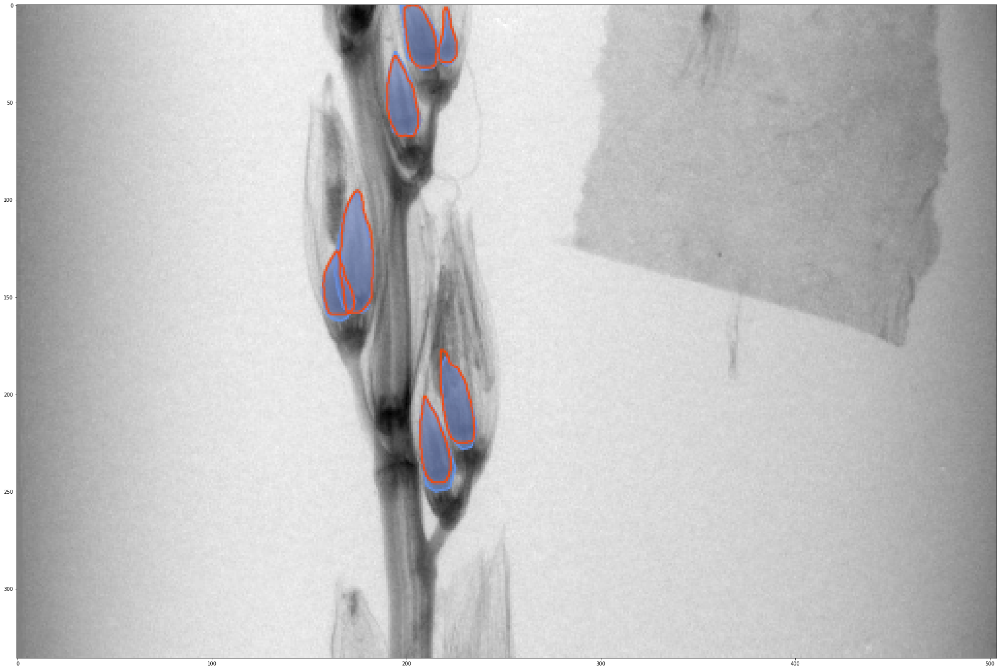

Calculating IoU for image 17 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/ra3gt1_4_-0600000002_jpg.rf.d7ba1f74d55683141a4acf6a2cd61a5e.jpg
Individual mask IoUs [0.8034042553191489, 0.8089430894308943]
Mean IoU for image 0.8061736723750217


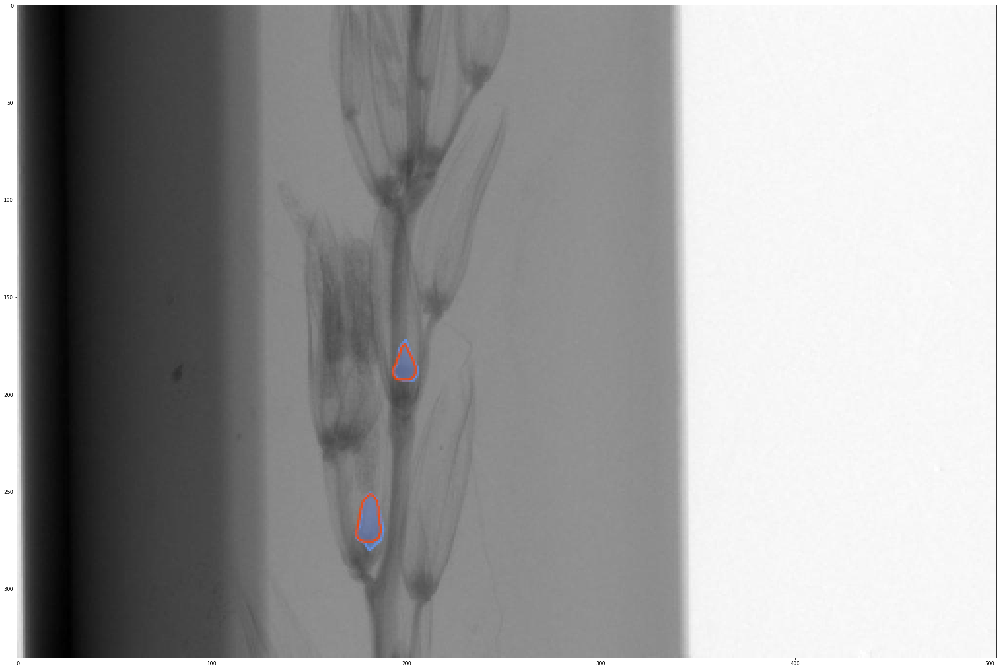

Calculating IoU for image 18 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/448-1-0200000009_jpg.rf.936c00709e2313e76d903549ef07be94.jpg
Individual mask IoUs [0.9417989417989417, 0.8967412642324303, 0.8651951123374064, 0.8300064391500322, 0.882480173035328, 0.8506051437216339, 0.9001669449081803, 0.8591417910447762, 0.7713602187286398, 0.7772900204858063, 0.8600284495021338, 0.8914798206278027, 0.8037699371677138, 0.8554182236274792, 0.9006067610517191, 0.9222588925559223, 0.8264896573016363, 0.9104788341429563, 0.7918258212375859, 0.8821536144578314, 0.6666666666666666, 0.8306451612903226]
Mean IoU for image 0.8507549040487704


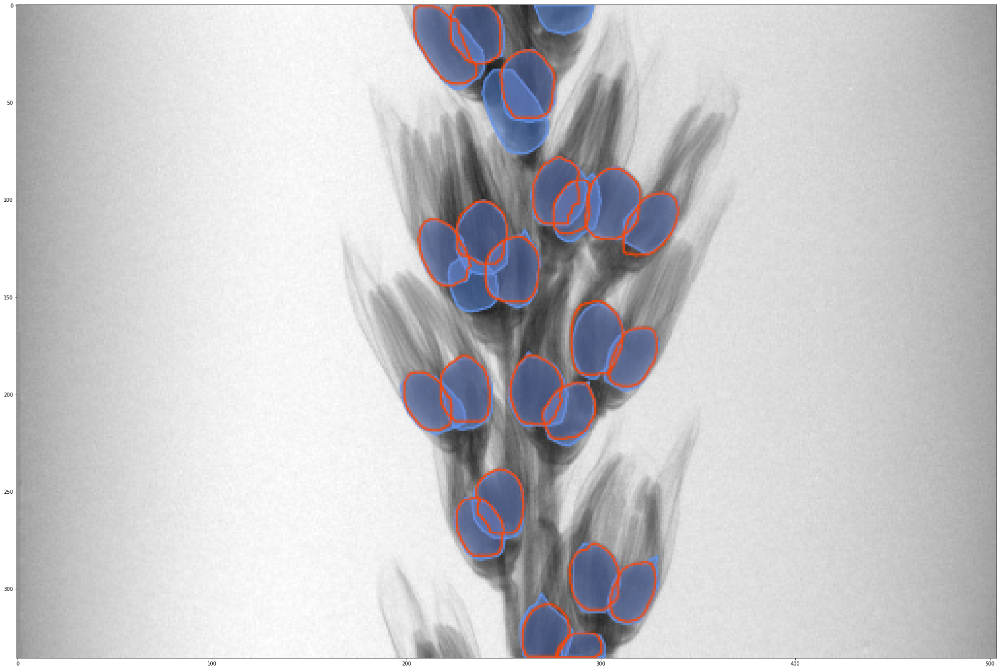

Calculating IoU for image 19 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/gt1_p_test3-0600000009_jpg.rf.41e673cd6808ac0ec42c42e8fdd7e17b.jpg
Individual mask IoUs [0.6836734693877551, 0.8324873096446701, 0, 0.821078431372549, 0.7967032967032966, 0.44981412639405205, 0]
Mean IoU for image 0.5119652333574747


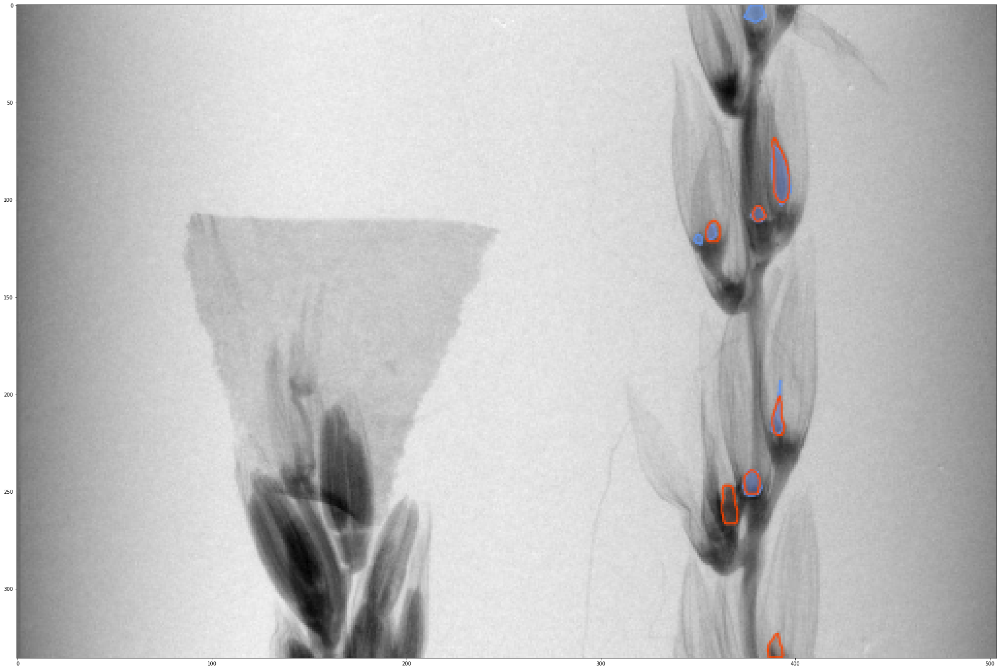

Calculating IoU for image 20 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/158-6-0500000009_jpg.rf.afd598dcb10373053dd7d6b1090e7c20.jpg
Individual mask IoUs [0.8698435277382646, 0.5322436849925706, 0.8571428571428571, 0.8005524861878454]
Mean IoU for image 0.7649456390153844


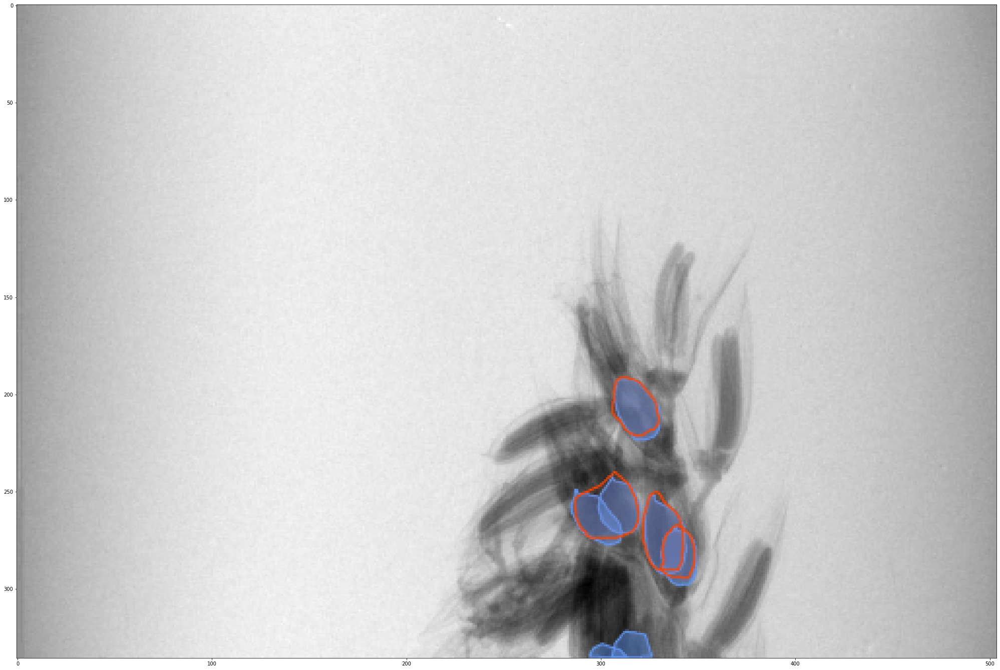

Calculating IoU for image 21 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/447-8-0100000009_jpg.rf.24ec84daf0dbe8082e35ed07c8bd6a84.jpg
Individual mask IoUs [0.9038838760298156, 0.8972833117723157, 0.8776223776223776, 0.8355831533477321, 0.9022462562396006, 0.7474351237175618, 0.7982744453574363, 0.8925518925518926, 0.9151111111111111, 0.8703620920876174, 0.8231426692965155, 0.9011504047720494, 0.8986948415164698, 0.767342582710779, 0.9074889867841409, 0.5602200347423277, 0.7560126582278481, 0.9108247422680412, 0.900920245398773, 0.8398411647915288, 0.36406067677946324, 0.8492005813953488, 0.8177083333333334, 0.9051190088033909, 0.6953024453024453, 0.8181272509003601, 0.6659492036160137]
Mean IoU for image 0.8156096100176403


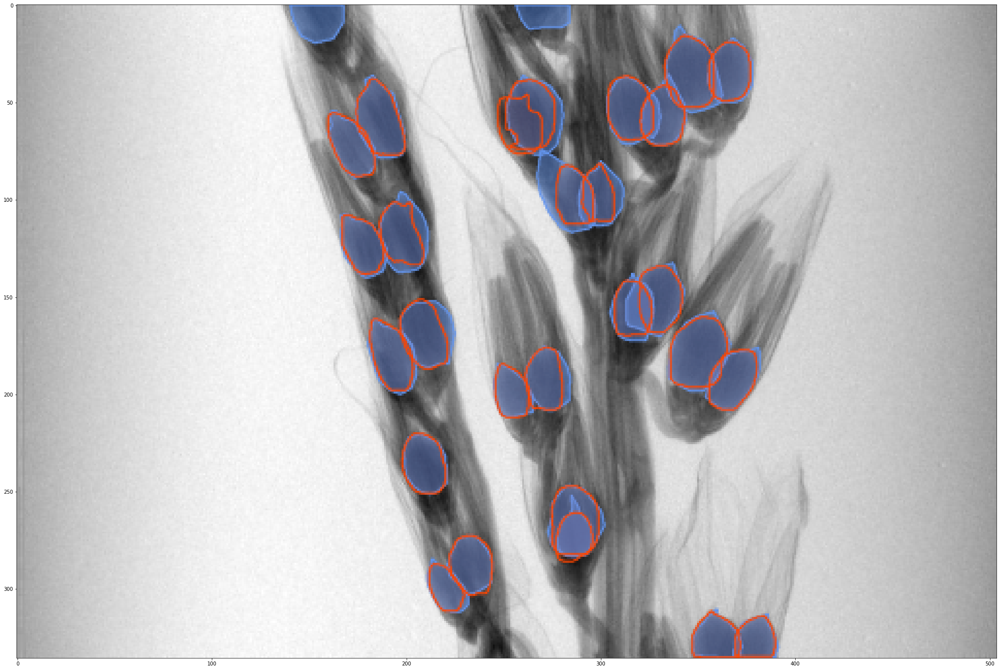

Calculating IoU for image 22 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/154-10-0500000009_jpg.rf.5c37c6cedb0d6aec3a9241d6ebd54a1f.jpg
Individual mask IoUs [0.8924558587479936, 0.8246650906225375, 0.9104922923918448, 0.9147286821705426, 0.4319349315068493, 0.8779704560051381, 0.7340401014058539, 0.8505555555555555, 0.8510054844606947, 0.8695293146160198, 0.7327478042659975, 0.7309236947791165, 0.03688383316097897]
Mean IoU for image 0.7429179307453173


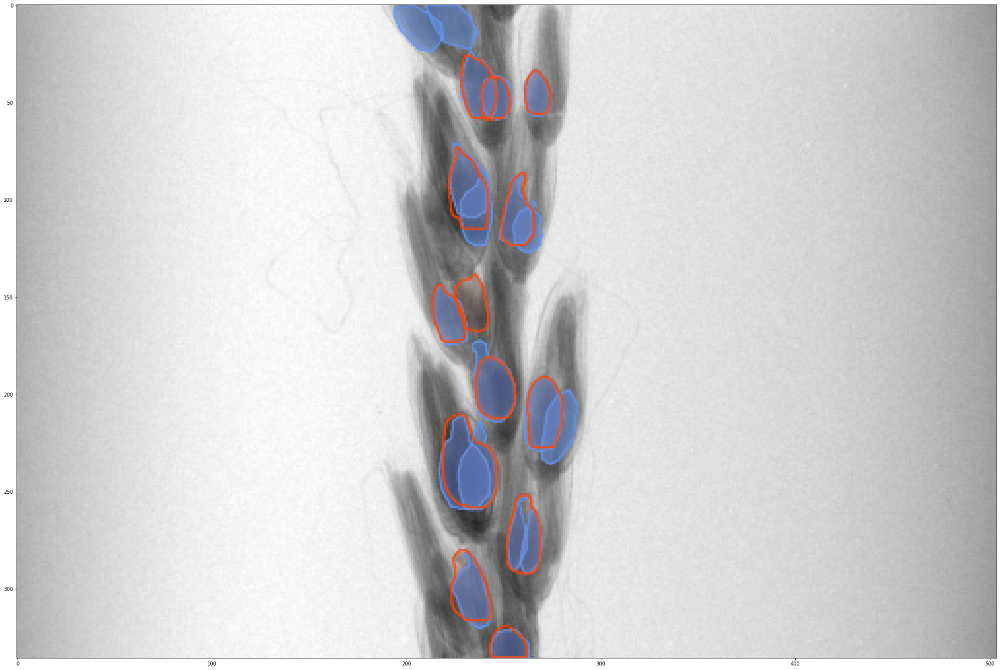

Calculating IoU for image 23 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/159-6-0400000008_jpg.rf.07bddac28d74937cdb222ff460d50fe9.jpg
Individual mask IoUs [0]
Mean IoU for image 0.0


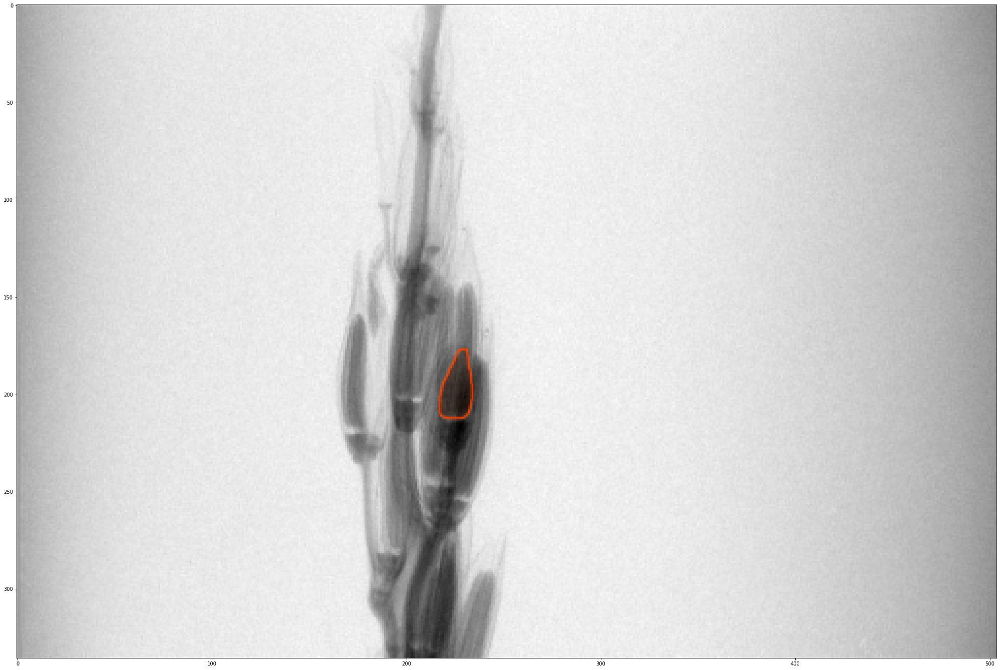

Calculating IoU for image 24 of 25 /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/maize_specific/test/447-5-0200000009_jpg.rf.6869551704c1c1dd5692ed0ca7c938c6.jpg
Individual mask IoUs [0.8666269723131884, 0.8923076923076924, 0.9060858819894965, 0.9016024739949395, 0.913089842708611, 0.8538461538461538, 0.8894490457328051, 0.9299874529485571, 0.9508134695421869, 0.887689713322091, 0.9206985399370169, 0.9658948685857321, 0.8392359729407083, 0.8176486270327913, 0.8346911065852003, 0.899618432638685, 0.8675656984785616, 0.9166125892277742, 0.9044906166219839, 0.6750433275563258, 0.7137223974763407, 0.8626394767218161, 0.8253058103975535, 0.8321299638989169, 0.7901506798970966, 0.7804793331017714, 0.8468809073724007, 0.8704074816299265, 0.6811541271000731]
Mean IoU for image 0.8564092639967721


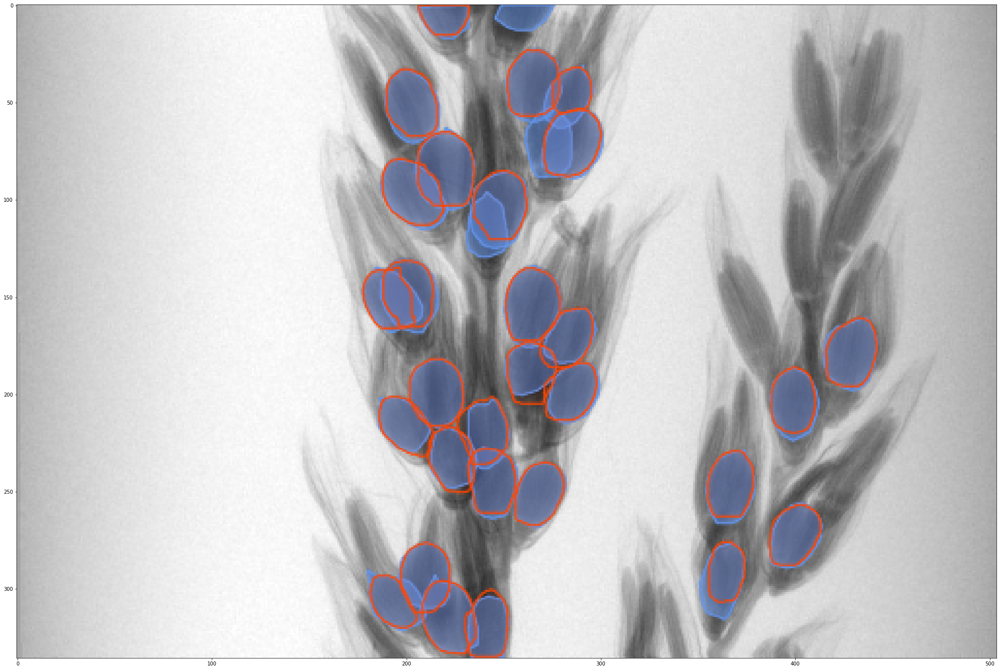

Mean IoUs for each image in test set [0.7114300419200607, 0.7413678801068005, 0.8449386174729919, 0.8413798244418166, 0.7773482045520134, 0.8024380176663675, 0.717198379691372, 0.8082158396909702, 0.8367876257003495, 0.0, 0.8145838756519785, 0.8769246303382423, 0.8536932993751621, 0.7264272520247843, 0.8236046988101428, nan, 0.8442741795597923, 0.8061736723750217, 0.8507549040487704, 0.5119652333574747, 0.7649456390153844, 0.8156096100176403, 0.7429179307453173, 0.0, 0.8564092639967721]
Mean across whole test set nan
Total ground truth annotations for whole set 396
Total predictions for whole set 320


([0.9957520961761475,
  0.9861611127853394,
  0.9809695482254028,
  0.9755163192749023,
  0.96678626537323,
  0.9553871750831604,
  0.9007076025009155,
  0.8746834397315979,
  0.8201661109924316,
  0.9860386252403259,
  0.9571477770805359,
  0.957011878490448,
  0.9562931060791016,
  0.9499416351318359,
  0.8915033340454102,
  0.8587847948074341,
  0.9930450320243835,
  0.9927863478660583,
  0.9918891787528992,
  0.9914826154708862,
  0.9912992119789124,
  0.9909466505050659,
  0.9851896166801453,
  0.9803134799003601,
  0.9801042079925537,
  0.9603940844535828,
  0.9549741148948669,
  0.9500731229782104,
  0.9332020282745361,
  0.9035048484802246,
  0.9897218346595764,
  0.988723635673523,
  0.9886246919631958,
  0.9885899424552917,
  0.9883402585983276,
  0.9882718920707703,
  0.9822271466255188,
  0.9816182255744934,
  0.9815811514854431,
  0.981126606464386,
  0.9810171723365784,
  0.9766454696655273,
  0.9766238331794739,
  0.9710870385169983,
  0.9707461595535278,
  0.97032552957

<Figure size 2592x1728 with 0 Axes>

In [14]:
#whole test test, .82 conf threshold
type_metadata = MetadataCatalog.get("test_maize_specific")
datasetDict = DatasetCatalog.get("test_maize_specific")
calcTestsetMaskIoU(datasetDict)

In [26]:
#IoU score, averaged by image for .82 cutoff
#if no detections, removed image from calculation
iou_list=[0.7114300419200607, 0.7413678801068005, 0.8449386174729919, 0.8413798244418166, 0.7773482045520134, 0.8024380176663675, 0.717198379691372, 0.8082158396909702, 0.8367876257003495, 0.8145838756519785, 0.8769246303382423, 0.8536932993751621, 0.7264272520247843, 0.8236046988101428, 0.8442741795597923, 0.8061736723750217, 0.8507549040487704, 0.5119652333574747, 0.7649456390153844, 0.8156096100176403, 0.7429179307453173, 0.8564092639967721]
sum(iou_list)/len(iou_list)

0.7895176645708738

In [3]:
import pandas as pd
data = pd.read_csv("precision_recall.csv")
data

,Unnamed: 0,conf,ious,iou0.5,precision,recall,f1,iou0.55,iou0.6,iou0.65,iou0.7,iou0.75,iou0.8,iou0.85,iou0.9,iou0.95
0,0,0.996386,0.803404,True,1.000000,0.002525,0.005038,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,0.995752,0.870826,True,1.000000,0.005051,0.010050,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,0.995330,0.905931,True,1.000000,0.007576,0.015038,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,0.994825,0.875817,True,1.000000,0.010101,0.020000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,0.994454,0.881340,True,1.000000,0.012626,0.024938,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7465,742,0.051015,0.304210,False,0.002692,0.005051,0.003512,False,False,False,False,False,False,False,False,False
7466,743,0.050573,0.365116,False,0.002688,0.005051,0.003509,False,False,False,False,False,False,False,False,False
7467,744,0.050506,0.000000,False,0.002685,0.005051,0.003506,False,False,False,False,False,False,False,False,False
7468,745,0.050191,0.037318,False,0.002681,0.005051,0.003503,False,False,False,False,False,False,False,False,False


In [21]:
#calculate average IoU score (for true matches only > .5), extract first iteration, all IoU values, sum and divide by length
iouList=data.head(747)[data.head(747)["iou0.5"] == True].ious
sum(iouList)/len(iouList)

0.7948818197655462

In [37]:
# Calculate IQR, median,mode
Q1 = iouList.quantile(0.25)
Q3 = iouList.quantile(0.75)
IQR = Q3 - Q1
print("IQR:", Q1, Q3, IQR)
print(iouList.median())
print(round(iouList, 3).mode())

IQR: 0.7328646748681898 0.8871085214857976 0.1542438466176077
0.8346911065852003
0    0.851
Name: ious, dtype: float64


#precision and recall for each threshold (from csv), .82 thresh

iou .5 - 0.95625,0.7727272727272727
iou .55 - 0.946875,0.7651515151515151
iou .6 - 0.93125,0.7525252525252525
iou .65 - 0.91875,0.7424242424242424
iou .7 - 0.884375,0.7146464646464646
iou .75 - 0.834375,0.6742424242424242
iou .8 - 0.728125,0.5883838383838383
iou .85 - 0.546875,0.4419191919191919
iou .9 - 0.21875,0.176767676767676
iou .95 - 0.00625,0.005050505050505051


In [31]:
precisionlist=[0.95625,0.946875,0.93125,0.91875,0.884375,0.834375,0.728125,0.546875,0.21875,0.00625]
sum(precisionlist)/len(precisionlist)


0.6971875

In [32]:
recalllist=[0.7727272727272727, 0.7651515151515151, 0.7525252525252525, 0.7424242424242424, 0.7146464646464646, 
           0.6742424242424242, 0.5883838383838383, 0.4419191919191919, 0.176767676767676, 0.005050505050505051]
sum(recalllist)/len(recalllist)



0.5633838383838382